# Solar Flare Period Finding from Inglis et al

This reconstructs the analysis in [Inglis et al (2015)](http://adsabs.harvard.edu/abs/2015ApJ...798..108I). 

In this paper, the authors model the *periodogram* of the solar flare with three models: 
* a power law
* a power law and a Gaussian
* a broken power law

Here's the definitions of the models:

#### Power Law Model

$$
S_0(f) = A_0 f^{-\alpha_0} + C_0
$$

#### Power Law + Gaussian

$$
S_1(f) = A_1f^{-\alpha_1} + B \exp{\left(\frac{-(\ln{f} - \ln{f_p})^2}{2\sigma^2}\right)}
$$

Constraints on the model parameters:
* $ 1 < P < 300\,\mathrm{s}$
* $0.05 < \sigma < 0.25$

#### Broken Power Law

$S_2(f) = $

\begin{cases}
    A_2 f^{-\alpha1} + C_2,& \text{if } f < f_\mathrm{break}\\
    A_2 f^{-\alpha_b - \alpha_a} f^{-\alpha_a} + C_2,              & \text{if } f > f_\mathrm{break}
\end{cases}



## The GBM Data

* binned to 1-second resolution!
* 


In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
sns.set_context('talk')

import numpy as np
import pandas as pd

import astropy.io.fits as fits

In [9]:
def read_catalogue(filename):
    # read in the catalogue
    catfile = open(filename, "r")
    catlines = catfile.readlines()
    catfile.close()


    catdict = {"date":[], "tstart":[], "hour":[], "minutes":[], "seconds":[],
               "duration":[], "peakcounts":[], "totalcounts":[],
               "det1": [], "det2":[], "det3":[], "det4":[], "trigname":[], "rhessi":[]}
    # run through all lines except for the first one
    # which contains the headers    
    for i,c in enumerate(catlines[1:]):
        i += 1
        # split by spaces
        # need to do this because there are variable spaces
        # between columns and a variable number of columns
        csplit = c.split(" ")
        cfilter = list(filter(None, csplit))
        # get the date of the observation
        catdict["date"].append(cfilter[0][:6])
        tstart = cfilter[2]
        catdict["tstart"].append(tstart)
        # get the hours and days
        catdict["hour"].append(int(tstart[:2]))
        catdict["minutes"].append(int(tstart[3:5]))
        catdict["seconds"].append(int(tstart[6:8]))
        catdict["duration"].append(int(cfilter[5]))
        catdict["peakcounts"].append(int(cfilter[6]))
        catdict["totalcounts"].append(int(cfilter[7]))

        catdict["det1"].append(cfilter[8])
        catdict["det2"].append(cfilter[9])
        catdict["det3"].append(cfilter[10])
        catdict["det4"].append(cfilter[11])

        if len(cfilter) == 13:
            if cfilter[12][:2] == "bn":
                catdict["trigname"].append(cfilter[12][:-2])
                catdict["rhessi"].append("")
            elif cfilter[12] == "\n":
                catdict["trigname"].append("")
                catdict["rhessi"].append("")
            else:
                catdict["rhessi"].append(cfilter[12][:-2])
                catdict["trigname"].append("")

        elif len(cfilter) == 14:
                catdict["trigname"].append(cfilter[12])
                catdict["rhessi"].append(cfilter[13][:-2])

        else:
                catdict["trigname"].append("")
                catdict["rhessi"].append("")

    catdf = pd.DataFrame(catdict)
    return catdf

In [10]:
cat = "/Users/danielahuppenkothen/work/data/solarflares/fermi/fermigbmcatalog.dat"

In [11]:
catdf = read_catalogue(cat)

In [14]:
catdf.head()

,date,tstart,hour,minutes,seconds,duration,peakcounts,totalcounts,det1,det2,det3,det4,trigname,rhessi
0,081102,20:14:55,20,14,55,78,3646,172685,n0,n3,n6,n1,,
1,081211,11:42:14,11,42,14,197,2408,90103,n5,n1,n3,n4,,812111
2,090706,17:02:53,17,2,53,139,2434,45224,n5,n1,n3,n4,,907060
3,091025,02:16:59,2,16,59,1114,3859,553653,n5,n1,n3,n4,,910250
4,091026,22:46:41,22,46,41,315,7237,187108,n5,n1,n3,n4,,


In [768]:
i = 8

In [769]:
date = catdf.loc[i, "date"]
tstart = catdf.loc[i, "tstart"]
duration = catdf.loc[i, "duration"]
detecs = [catdf.loc[i, "det1"],catdf.loc[i, "det2"],catdf.loc[i, "det3"],catdf.loc[i, "det4"]]

In [770]:
tstart

'19:36:39'

In [771]:
datadir = "/Users/danielahuppenkothen/work/data/solarflares/fermi/"

In [772]:
import glob

In [773]:
d1 = detecs[0]

f = glob.glob(datadir+"glg_ctime_%s_%s_*.pha"%(d1, date))


In [774]:
"glg_ctime_%s_%s_*.pha"%(d1, date)

'glg_ctime_n0_091027_*.pha'

In [775]:
f

['/Users/danielahuppenkothen/work/data/solarflares/fermi/glg_ctime_n0_091027_v00.pha']

In [776]:
def convert_hours_seconds(time):
    """
    Convert a HH:MM:SS string into 
    seconds since midnight.

    Parameters
    ----------
    time : str
        A time in HH:MM:SS format

    Returns
    -------
    tnew : float 
        seconds since midnight

    """
    hours = float(time[:2])*3600.0
    minutes = float(time[3:5])*60.0
    seconds = float(time[6:])
    tnew = hours + minutes + seconds
    return tnew


In [777]:
obs_start_met

247277875.772976

In [778]:
tstart_met

247351845.772976

In [779]:
hdulist = fits.open(f[0])

obs_start_met = hdulist[0].header["TSTART"]
obs_end_met = hdulist[0].header["TSTOP"]

# date plus start time of the observation, should be close to 
# midnight, but not quite midnight
date_obs = hdulist[0].header["DATE-OBS"]

if int(date[-2:]) > int(date_obs.split("T")[0].split("-")[-1]):
    neg = True
else: 
    neg = False

# just the observation start time in HH:MM:SS
obs_start = date_obs.split("T")[1]

# convert to seconds since midnight:
if neg:
    obs_start_sec = 86400 - convert_hours_seconds(obs_start)
else:
    obs_start_sec = convert_hours_seconds(obs_start)

hdulist.close()

# start time in seconds since midnight
tstart = convert_hours_seconds(tstart)

# tstart in MET is the time since observation start, i.e. the 
# seconds since midnight minus the seconds between midnight and the 
# start of the observation plus the MET of the start of the observation
tstart_met = tstart + obs_start_met + obs_start_sec


In [780]:
def read_fermi_gbm_file(filename, tstart, duration, emin=10, emax=30, add_seconds=10):
    """
    Read a CTIME file from Fermi/GBM.

    Parameters
    ----------
    filename : str
        A Fermi/GBM CTIME file name + path

    tstart : float
        The start time for the burst in Fermi Mission Elapsed Time (MET)

    duration : float 
        The duration of the flare in seconds

    emin, emax: float, float
        The minimum and maximum energies to use in keV

    add_seconds : float
        The number of seconds to add before and after the burst for a 
        baseline for the bakground.

    Returns
    -------
    tnew, cnew : np.array, np.array
        Time and counts arrays. Counts are summed over channels


    """
    hdulist = fits.open(filename)

    # get out channel-to-energy conversion
    channel = hdulist[1].data.field("CHANNEL")
    e_min_channel = hdulist[1].data.field("E_MIN")
    e_max_channel = hdulist[1].data.field("E_MAX")

    # only the channels between emin and emax are interesting
    valid_channels = channel[(e_min_channel >= emin) & (e_max_channel <= emax)]

    # get out the time and counts arrays
    time = hdulist[2].data.field("TIME")
    counts = hdulist[2].data.field("COUNTS")

    valid_counts = counts[:, valid_channels]
    valid_counts = np.sum(valid_counts, axis=1)

    # start and end times
    tend = tstart + duration
    ts = tstart - add_seconds
    te = tend + add_seconds

    min_ind = time.searchsorted(ts)
    max_ind = time.searchsorted(te)
    
    tnew = time[min_ind:max_ind]
    cnew = valid_counts[min_ind:max_ind]

    return tnew, cnew




In [781]:
detecs

['n0', 'n3', 'n1', 'n6']

In [782]:
emin = 10.0
emax = 30.0
add_seconds = 10.0

In [783]:
# loop over all detectors and get out the light curve for each for 
# the given start time and duration
c_all = []
for d in detecs:
    f = glob.glob(datadir+"glg_ctime_%s_%s_*.pha"%(d, date))
    tnew, cnew = read_fermi_gbm_file(f[0], tstart_met, duration, emin=emin, emax=emax, add_seconds=add_seconds)
    c_all.append(cnew)


In [784]:
c_all = np.array(c_all)

# sum over all detectors
csum = np.sum(c_all, axis=0)

# compute length of each time bin
tdiff = np.diff(tnew)
# add the last time bin
tdiff = np.hstack([tdiff, tdiff[-1]])

# compute the count rate in counts/s
countrate = csum/tdiff


<IPython.core.display.Javascript object>


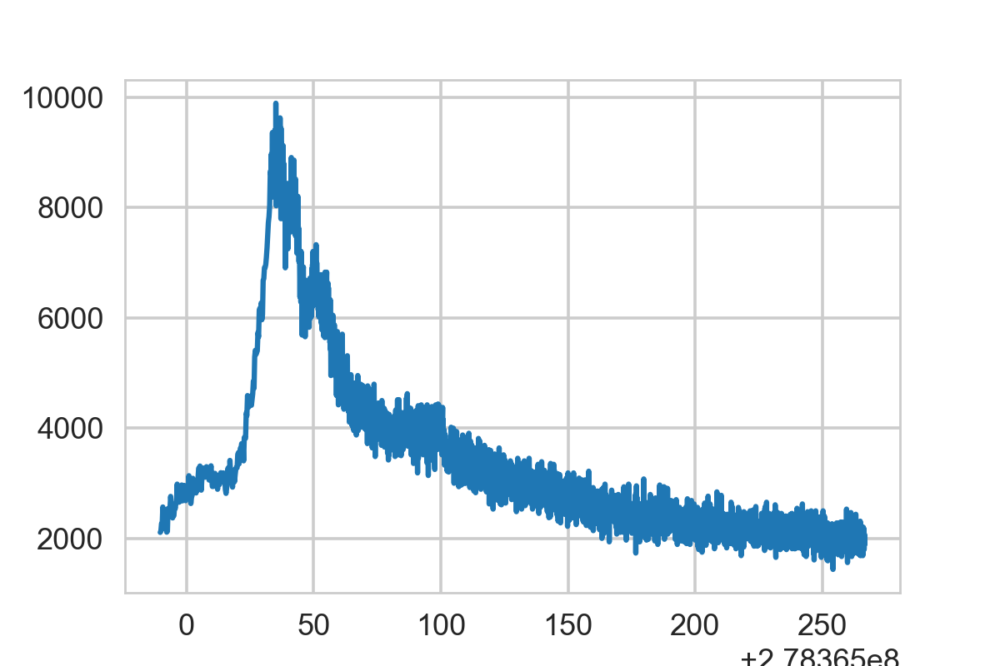

In [785]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.plot(tnew, countrate)

In [788]:
dt = np.diff(tnew)

<IPython.core.display.Javascript object>


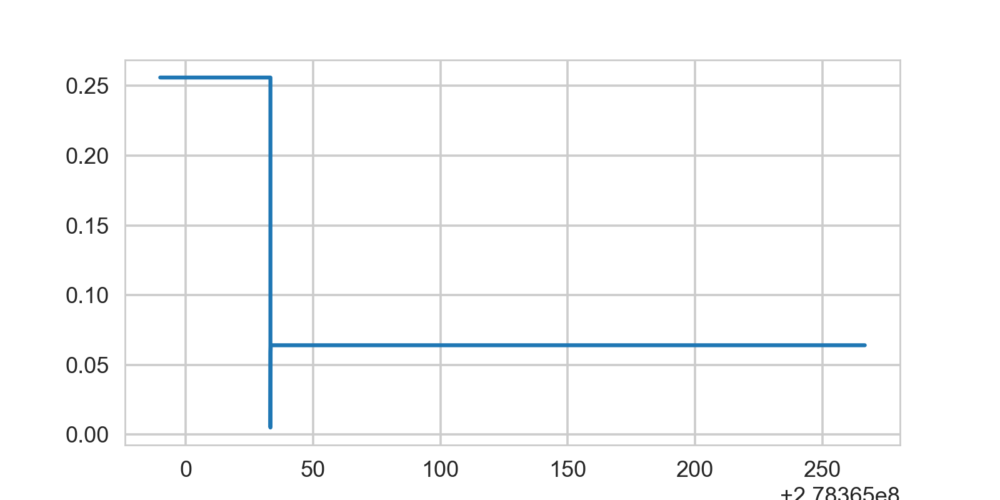

In [789]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.plot(tnew[1:], dt)

Okay, that has two different time resolutions! Ugh. Okay, we're going to have to do some clever rebinning:

In [792]:
def rebin_data(x, y, dx_new, yerr=None, method='sum', dx=None):
    """Rebin some data to an arbitrary new data resolution. Either sum
    the data points in the new bins or average them.

    Parameters
    ----------
    x: iterable
        The dependent variable with some resolution ``dx_old = x[1]-x[0]``

    y: iterable
        The independent variable to be binned

    dx_new: float
        The new resolution of the dependent variable ``x``

    Other parameters
    ----------------
    yerr: iterable, optional
        The uncertainties of ``y``, to be propagated during binning.

    method: {``sum`` | ``average`` | ``mean``}, optional, default ``sum``
        The method to be used in binning. Either sum the samples ``y`` in
        each new bin of ``x``, or take the arithmetic mean.

    dx: float
        The old resolution (otherwise, calculated from median diff)

    Returns
    -------
    xbin: numpy.ndarray
        The midpoints of the new bins in ``x``

    ybin: numpy.ndarray
        The binned quantity ``y``

    ybin_err: numpy.ndarray
        The uncertainties of the binned values of ``y``.

    step_size: float
        The size of the binning step
    """

    y = np.asarray(y)
    yerr = np.zeros_like(y)

    #dx_old = assign_value_if_none(dx, np.median(np.diff(x)))
    dx_old = np.diff(x)

    if np.any(dx_new < dx_old):
        raise ValueError("New frequency resolution must be larger than "
                         "old frequency resolution.")


    # left and right bin edges
    # assumes that the points given in `x` correspond to 
    # the left bin edges
    xedges = np.hstack([x, x[-1]+np.diff(x)[-1]])

    # new regularly binned resolution
    xbin = np.arange(xedges[0], xedges[-1]+dx_old[-1], dx_new)

    output, outputerr, step_size = [], [], []

    for i in range(len(xbin)-1):
        total = 0
        total_err = 0

        nn = 0

        xmin = xbin[i]
        xmax = xbin[i+1]
        min_ind = xedges.searchsorted(xmin)
        max_ind = xedges.searchsorted(xmax)

        total += np.sum(y[min_ind:max_ind-1])
        total_err += np.sum(yerr[min_ind:max_ind-1])
        nn += len(y[min_ind:max_ind-1])

        prev_dx = xedges[min_ind] - xedges[min_ind-1]
        prev_frac = (xedges[min_ind] - xmin)/prev_dx
        total += y[min_ind-1]*prev_frac
        total_err += yerr[min_ind-1]*prev_frac
        nn += prev_frac

        if xmax <= xedges[-1]:
            dx_post = xedges[max_ind] - xedges[max_ind-1]
            post_frac = (xmax-xedges[max_ind-1])/dx_post
            total += y[max_ind-1]*post_frac
            total_err += yerr[max_ind-1]*post_frac
            nn += prev_frac

        output.append(total)
        outputerr.append(total_err)
        step_size.append(nn)

    output = np.asarray(output)
    outputerr = np.asarray(outputerr)

    if method in ['mean', 'avg', 'average', 'arithmetic mean']:
        ybin = output / np.float(step_size)
        ybinerr = outputerr / np.sqrt(np.float(step_size))

    elif method == "sum":
        ybin = output
        ybinerr = outputerr

    else:
        raise ValueError("Method for summing or averaging not recognized. "
                         "Please enter either 'sum' or 'mean'.")

    tseg = x[-1] - x[0] + dx_old

    #if (tseg / dx_new % 1) > 0:
    #    ybin = ybin[:-1]
    #    ybinerr = ybinerr[:-1]

    #new_x0 = (x[0] - (0.5 * dx_old)) + (0.5 * dx_new)
    #xbin = np.arange(ybin.shape[0]) * dx_new + new_x0

    return xbin[:-1], ybin, ybinerr, step_size

In [793]:
tbin, cbin, cbinerr, step_size = rebin_data(tnew, csum, 1.0, yerr=None, method='sum')

<IPython.core.display.Javascript object>


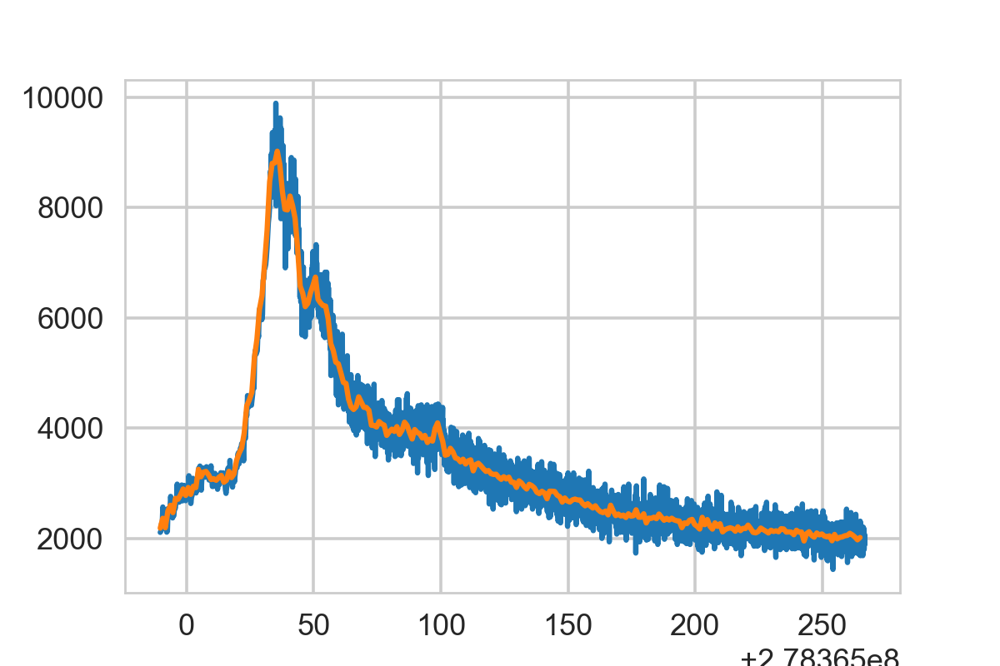

In [794]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.plot(tnew, countrate)
ax.plot(tbin, cbin)

Ok, that looks good! 

## Modelling the Data

In [797]:
from stingray import Lightcurve, Powerspectrum
from stingray.modeling import PSDLogLikelihood, PSDParEst

First step, according to Inglis et al, is to normalize the input data according to 

$$
I_\mathrm{norm} = \frac{I - \vec{I}}{\vec{I}}
$$

In [801]:
mean_cbin = np.mean(cbin)
cbin_norm = (cbin - mean_cbin)/mean_cbin

In [802]:
lc = Lightcurve(tbin, cbin_norm)

Now we need to generate a Hann window function:

In [818]:
import scipy.signal
window = scipy.signal.hann(lc.n)

multiply the light curve by the window:

In [819]:
lc.counts *= window

<IPython.core.display.Javascript object>


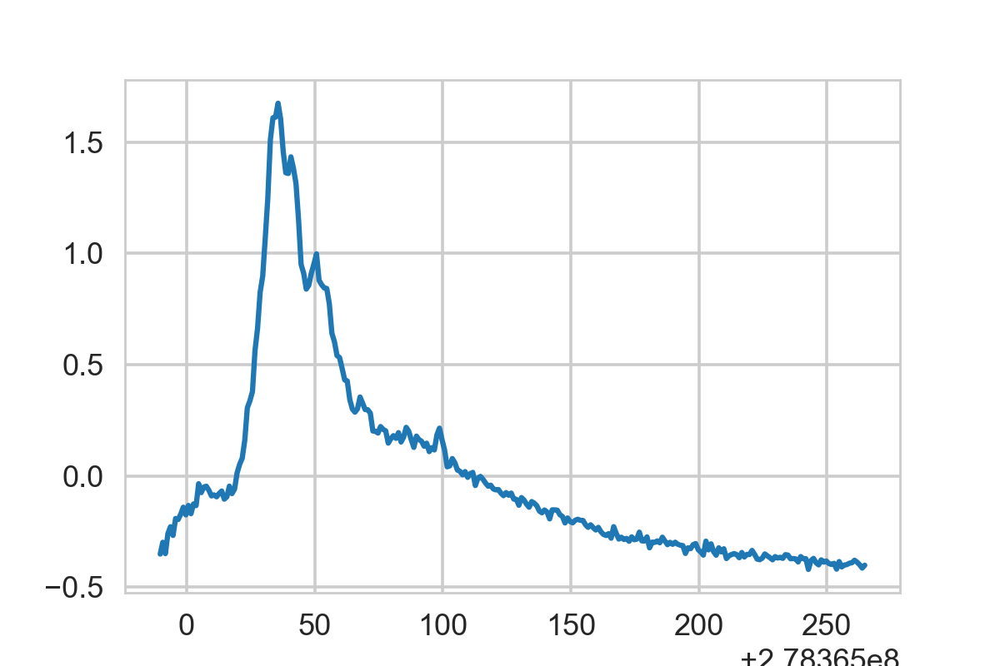

In [820]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.plot(lc.time, lc.countrate)

In [864]:
ps = Powerspectrum(lc, norm="abs")

<IPython.core.display.Javascript object>


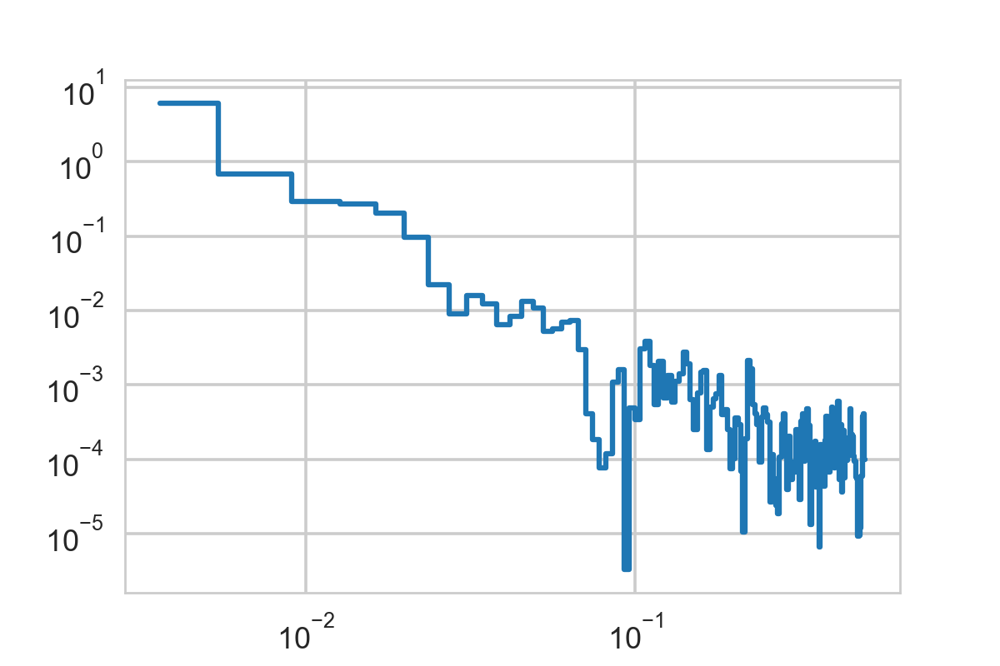

In [865]:
fig, ax = plt.subplots(1,1, figsize=(6,4))

ax.loglog(ps.freq, ps.power, linestyle="steps-mid")

Let's now make the functions we're going to use for modelling:

In [867]:
from astropy.modeling import models

In [868]:
# define power law component
pl = models.PowerLaw1D()

# fix x_0 of power law component
pl.x_0.fixed = True

# define constant
c = models.Const1D()

# make compound model
s0 = pl + c

Now let's make a compound model that includes the Gaussian function. The Gaussian uses $\ln(f)$ for the frequency, so we'll need to build our own model

In [869]:
from astropy.modeling.models import custom_model

In [870]:
@custom_model
def LogGaussian(x, amplitude=1.0, mean=0.0, stddev=1.0):
    logx = np.log(x)
    
    gauss = amplitude * np.exp(-(np.log(x) - np.log(mean))**2./(2.*stddev**2.))
    
    return gauss

In [871]:

g = LogGaussian()

s1 = pl + g + c

Finally, we need the broken power law plus a constant:

In [872]:
# broken power law model
bpl = models.BrokenPowerLaw1D()

# add constant
s2 = bpl + c

Ok, cool. Now we can define the different likelihoods:

In [873]:
ll_s0 = PSDLogLikelihood(ps.freq, ps.power, s0, m=1)

ll_s1 = PSDLogLikelihood(ps.freq, ps.power, s1, m=1)

ll_s2 = PSDLogLikelihood(ps.freq, ps.power, s2, m=1)

Let's stick these into the optimizer:

In [874]:
parest = PSDParEst(ps, fitmethod="powell", max_post=False)

We need some starting values for our different models:

In [876]:
s0.param_names

('amplitude_0', 'x_0_0', 'alpha_0', 'amplitude_1')

In [877]:
s0_test = [10, 2.0, 1e-4]

In [878]:
s1.param_names

('amplitude_0',
 'x_0_0',
 'alpha_0',
 'amplitude_1',
 'mean_1',
 'stddev_1',
 'amplitude_2')

In [897]:
s1_test = [10, 2.0, 1, 0.01, 0.1, 1e-4]

In [898]:
s2.param_names

('amplitude_0', 'x_break_0', 'alpha_1_0', 'alpha_2_0', 'amplitude_1')

In [899]:
s2_test = [10, 0.02, 0.5, 1.5, 1e-4]

In [900]:
res0 = parest.fit(ll_s0, s0_test)

In [901]:
res1 = parest.fit(ll_s1, s1_test)

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packa

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packa

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packa

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packa

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: underflow encountered in multiply
  """
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packa

In [902]:
res2 = parest.fit(ll_s2, s2_test)

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/astropy/modeling/powerlaws.py:124: RuntimeWarning: invalid value encountered in power
  return amplitude * xx ** (-alpha)
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/astropy/modeling/powerlaws.py:124: RuntimeWarning: invalid value encountered in power
  return amplitude * xx ** (-alpha)
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/astropy/modeling/powerlaws.py:124: RuntimeWarning: invalid value encountered in power
  return amplitude * xx ** (-alpha)
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/astropy/modeling/powerlaws.py:124: RuntimeWarning: invalid value encountered in power
  return amplitude * xx ** (-alpha)
/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/astropy/modeling/powerlaws.py:124: RuntimeWarning: invalid value encountered in power
  return amplitude * xx ** (-alpha)
/Users/danielahuppen

<IPython.core.display.Javascript object>


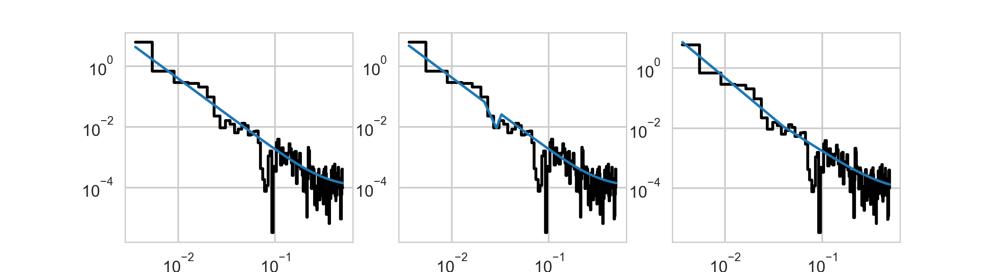

In [903]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(11,3))

ax1.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black")
ax1.plot(ps.freq, res0.mfit, lw=2)

ax2.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black")
ax2.plot(ps.freq, res1.mfit, lw=2)

ax3.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black")
ax3.plot(ps.freq, res2.mfit, lw=2)



In [905]:
res0.bic

-855.4593271885253

In [906]:
res1.bic

-841.4504997425784

In [907]:
res2.bic

-846.223728941465

In [916]:
dbic1 = res1.bic - res0.bic

In [917]:
dbic2 = res1.bic - res2.bic

In [918]:
dbic3 = res2.bic - res0.bic

In [920]:
print("Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): " + str(dbic1))
print("Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): " + str(dbic2))
print("Delta BIC for BPL versus PL model (large positive number means PL is favoured): " + str(dbic3))

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.008827445946963
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.773229198886611
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.235598247060352


Let's write a function that can do this in one go:

In [921]:
datadir

'/Users/danielahuppenkothen/work/data/solarflares/fermi/'

In [973]:
lc_files = glob.glob(datadir + "*_lc.dat")

In [974]:
lc_files[:5]

['/Users/danielahuppenkothen/work/data/solarflares/fermi/091026_278290001.537100_lc.dat',
 '/Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287309102.569092_lc.dat',
 '/Users/danielahuppenkothen/work/data/solarflares/fermi/090706_268592573.521116_lc.dat',
 '/Users/danielahuppenkothen/work/data/solarflares/fermi/091219_282874369.628920_lc.dat',
 '/Users/danielahuppenkothen/work/data/solarflares/fermi/100102_284134523.616678_lc.dat']

In [975]:
f = lc_files[0]

In [976]:
data = np.loadtxt(f)

In [977]:
data

array([[2.78289992e+08, 1.40938257e+03, 3.75417444e+01],
       [2.78289993e+08, 1.43187782e+03, 3.78401614e+01],
       [2.78289994e+08, 1.43919479e+03, 3.79367209e+01],
       ...,
       [2.78290324e+08, 1.30902270e+03, 3.61804187e+01],
       [2.78290325e+08, 1.28909114e+03, 3.59039153e+01],
       [2.78290326e+08, 1.30156776e+03, 3.60772471e+01]])

In [978]:
lc = Lightcurve(data[:,0], data[:,1], err=data[:,2], input_counts=False)

In [979]:
f

'/Users/danielahuppenkothen/work/data/solarflares/fermi/091026_278290001.537100_lc.dat'

In [1000]:
import numpy.linalg

In [1001]:
def model_periodogram(filename):
    # load the data from file
    # file should contain 3 columns:
    # time, countrate, countrate error
    data = np.loadtxt(filename)
    
    # compute the mean of the count rate
    mean_cr = np.mean(data[:,1])
    
    # compute the normalized count rate
    cr_norm = (data[:,1] - mean_cr)/mean_cr
    
    # create a Lightcurve object
    lc = Lightcurve(data[:,0], cr_norm, err=data[:,2], input_counts=False)

    # generate the window function
    window = scipy.signal.hann(lc.n)

    # multiply counts by window
    lc.counts *= window
    
    # generate the PSD
    ps = Powerspectrum(lc, norm="abs")
    
    # create the models
    
    # define power law component
    pl = models.PowerLaw1D()

    # fix x_0 of power law component
    pl.x_0.fixed = True

    # define constant
    c = models.Const1D()

    # make compound model
    s0 = pl + c

    @custom_model
    def LogGaussian(x, log_amplitude=1.0, mean=0.0, stddev=1.0):
        logx = np.log(x)

        gauss = np.exp(log_amplitude) * np.exp(-(np.log(x) - np.log(mean))**2./(2.*stddev**2.))

        return gauss
    
    g = LogGaussian()

    s1 = pl + g + c

    # broken power law model
    bpl = models.BrokenPowerLaw1D()

    # add constant
    s2 = bpl + c
    
    # define the likelihood objects
    ll_s0 = PSDLogLikelihood(ps.freq, ps.power, s0, m=1)
    ll_s1 = PSDLogLikelihood(ps.freq, ps.power, s1, m=1)
    ll_s2 = PSDLogLikelihood(ps.freq, ps.power, s2, m=1)
    
    # the parameter estimation object
    parest = PSDParEst(ps, fitmethod="powell", max_post=False)
    
    # starting guesses for the parameters
    amp = ps.power[1]
    amp_qpo = amp/10.0
    
    pl_index1 = 2.0
    pl_index2 = 0.5
    whitenoise = np.mean(ps.power[-20:])
    
    s0_test = [amp, pl_index1, whitenoise]
    
    linalgerr = True
    while linalgerr == True:
        try:
            # fit the power law model
            res0 = parest.fit(ll_s0, s0_test)
            linalgerr = False
        except np.linalg.LinAlgError:
            linalgerr = True

    # calculate the residuals
    residuals = 2.*ps.power/res0.mfit
    
    # find the frequency with the maximmum power
    max_ind = np.argmax(residuals)
    
    s1_test = [amp, pl_index1, np.log(amp_qpo), ps.freq[max_ind], 0.1, whitenoise]
    s2_test = [amp, 0.02, pl_index2, pl_index1, whitenoise]

    linalgerr = True    
    while linalgerr == True:
        try:
            res1 = parest.fit(ll_s1, s1_test)
            linalgerr = False
        except np.linalg.LinAlgError:
            linalgerr = True

    linalgerr = True
    while linalgerr == True:
        try:
            res2 = parest.fit(ll_s2, s2_test)
            linalgerr = False
        except np.linalg.LinAlgError:
            linalgerr = True

    
    # calculate the difference in BICs:
    dbic1 = res1.bic - res0.bic
    dbic2 = res1.bic - res2.bic
    dbic3 = res2.bic - res0.bic
    print("The BIC for model S0 is: " + str(res0.bic))
    print("The BIC for model S1 is: " + str(res1.bic))
    print("The BIC for model S2 is: " + str(res2.bic) + "\n")
    
    print("Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): " + str(dbic1))
    print("Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): " + str(dbic2))
    print("Delta BIC for BPL versus PL model (large positive number means PL is favoured): " + str(dbic3))
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(11,3), sharey=True)

    ax1.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black", label="data")
    ax1.plot(ps.freq, res0.mfit, lw=2, label="model")
    ax1.set_title("Model S0: Power law + Constant", fontdict={"size":10})
    ax1.set_xlabel("Frequency [Hz]", fontdict={"size":10})
    ax1.set_ylabel("Power in Absolute RMS Normalization", fontdict={"size":10})
    ax1.legend()
    
    ax2.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black")
    ax2.plot(ps.freq, res1.mfit, lw=2)
    ax2.set_title("Model S1: Power law + Gaussian QPO + Constant", fontdict={"size":10})
    ax2.set_xlabel("Frequency [Hz]", fontdict={"size":10})
    
    ax3.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black")
    ax3.plot(ps.freq, res2.mfit, lw=2)
    ax3.set_title("Model S2: Broken Power Law + Constant", fontdict={"size":10})
    ax3.set_xlabel("Frequency [Hz]", fontdict={"size":10})
    
    plt.tight_layout()
    
    lc_name = filename.split("/")[-1]
    datadir = filename[:-len(lc_name)]
    lc_root = lc_name[:-7]
    
    plt.savefig(datadir + lc_root + "fits.pdf", format="pdf")
    #plt.close()
    
    return



The BIC for model S0 is: -811.914689494949
The BIC for model S1 is: -798.3986599179289
The BIC for model S2 is: -803.9406114938341

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.516029577020163
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.541951575905273
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.97407800111489


<IPython.core.display.Javascript object>


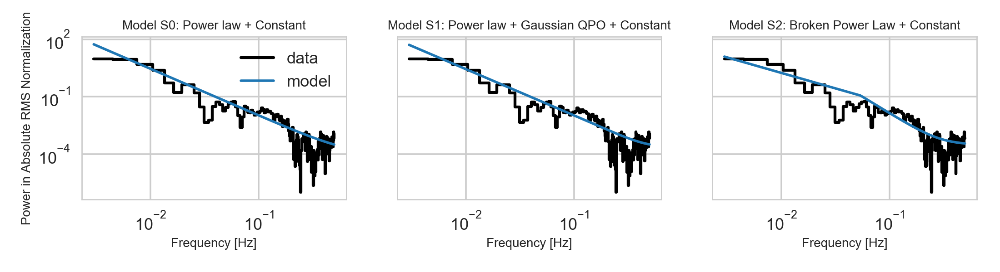

In [1002]:
model_periodogram(f)

In [987]:
import warnings
warnings.filterwarnings("ignore")

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091026_278290001.537100_lc.dat
The BIC for model S0 is: -811.9146894926137
The BIC for model S1 is: -796.7251304746139
The BIC for model S2 is: -802.7661549302333

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.189559017999727
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.041024455619322
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.148534562380405


<IPython.core.display.Javascript object>


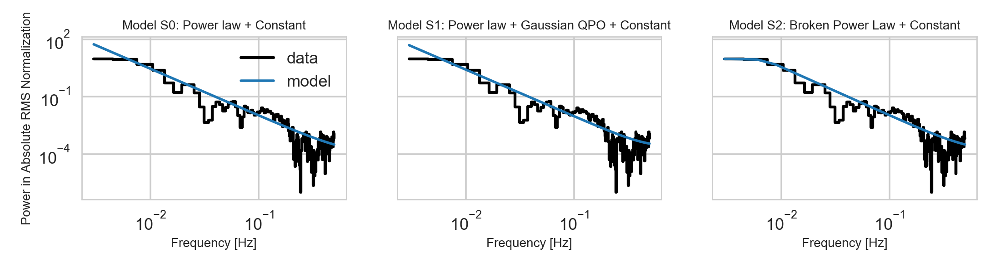

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287309102.569092_lc.dat
The BIC for model S0 is: -731.2790149124814
The BIC for model S1 is: -722.955161949403
The BIC for model S2 is: -721.8344795436781

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 8.32385296307848
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): -1.1206824057248923
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.444535368803372


<IPython.core.display.Javascript object>


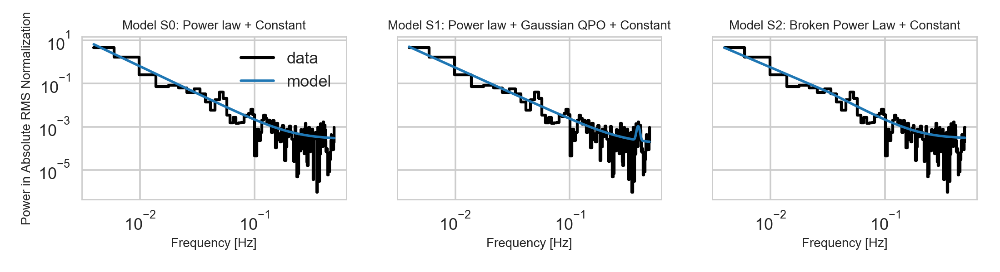

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/090706_268592573.521116_lc.dat
The BIC for model S0 is: -444.97925873385253
The BIC for model S1 is: -431.8052688788561
The BIC for model S2 is: -436.3188306483399

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.173989854996421
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.513561769483772
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.660428085512649


<IPython.core.display.Javascript object>


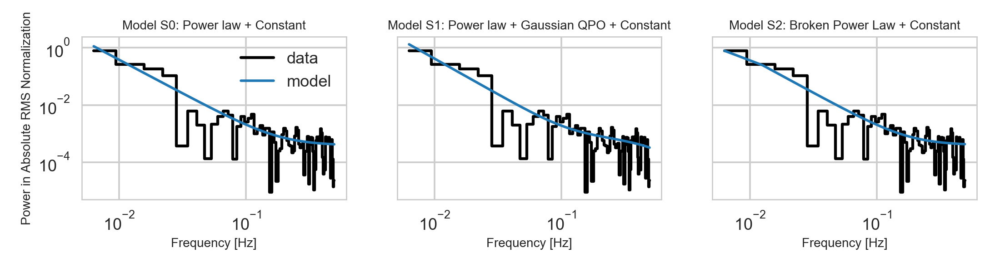

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091219_282874369.628920_lc.dat
The BIC for model S0 is: -809.3216467278188
The BIC for model S1 is: -794.3643926096967
The BIC for model S2 is: -801.4175036649775

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.957254118122137
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.053111055280851
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.904143062841285


<IPython.core.display.Javascript object>


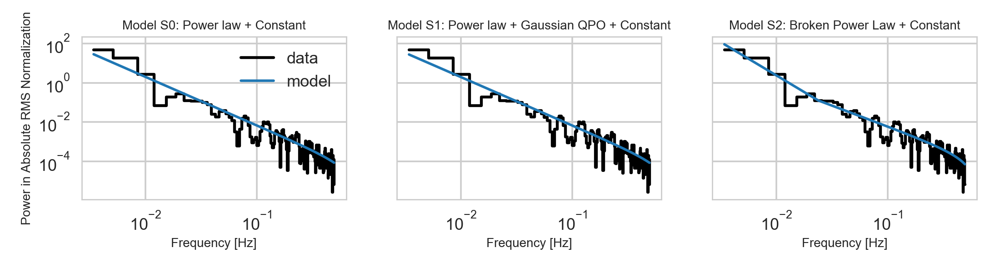

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100102_284134523.616678_lc.dat
The BIC for model S0 is: -2490.724487188326
The BIC for model S1 is: -2471.006712718885
The BIC for model S2 is: -2483.101389364188

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.717774469440883
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 12.094676645303025
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.623097824137858


<IPython.core.display.Javascript object>


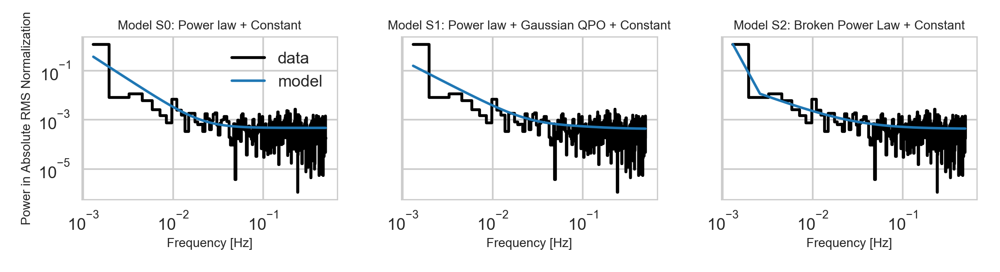

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285655809.585176_lc.dat
The BIC for model S0 is: -4192.901439980414
The BIC for model S1 is: -4171.6820962340535
The BIC for model S2 is: -4180.202216042989

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 21.21934374636021
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 8.520119808935306
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.699223937424904


<IPython.core.display.Javascript object>


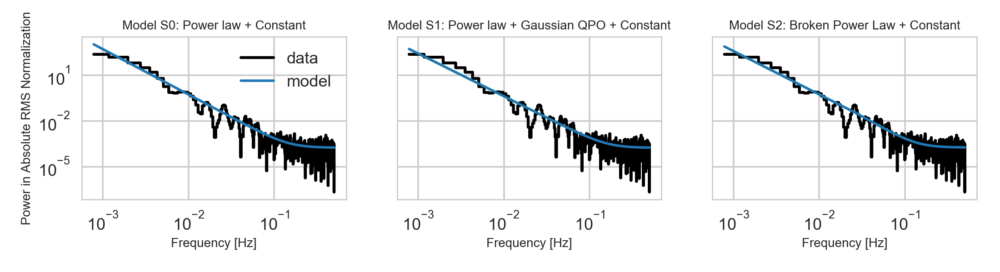

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285582887.642852_lc.dat
The BIC for model S0 is: -2166.1833350469255
The BIC for model S1 is: -2140.11312225355
The BIC for model S2 is: -2154.595538962793

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 26.070212793375504
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 14.482416709242898
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 11.587796084132606


<IPython.core.display.Javascript object>


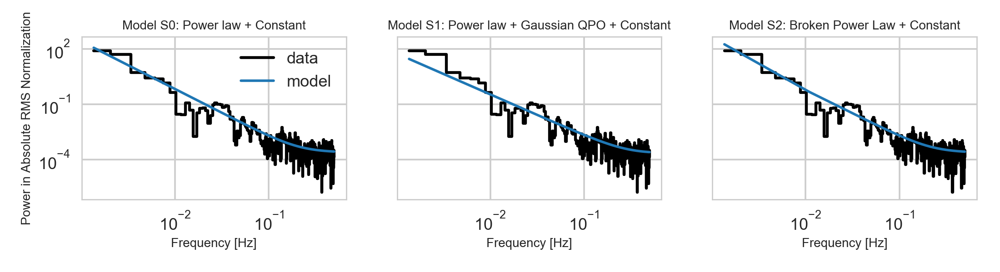

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100117_285459867.724406_lc.dat
The BIC for model S0 is: -2781.1203855105973
The BIC for model S1 is: -2765.1984952588855
The BIC for model S2 is: -2771.8476184540973

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.92189025171183
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.649123195211814
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.272767056500015


<IPython.core.display.Javascript object>


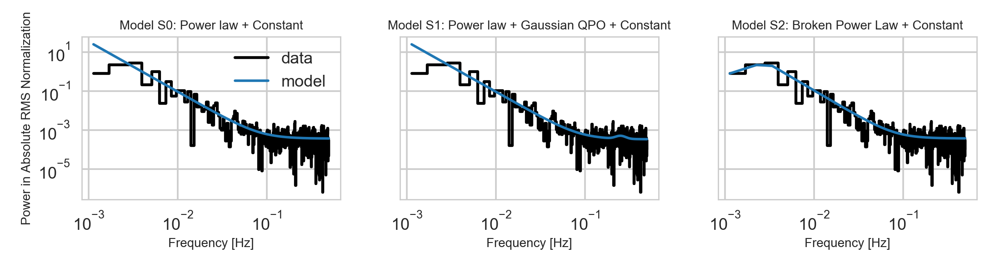

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091222_283150388.492568_lc.dat
The BIC for model S0 is: -2036.6331624592412
The BIC for model S1 is: -1788.4031233287487
The BIC for model S2 is: -2027.0019238309937

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 248.23003913049251
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 238.598800502245
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.631238628247502


<IPython.core.display.Javascript object>


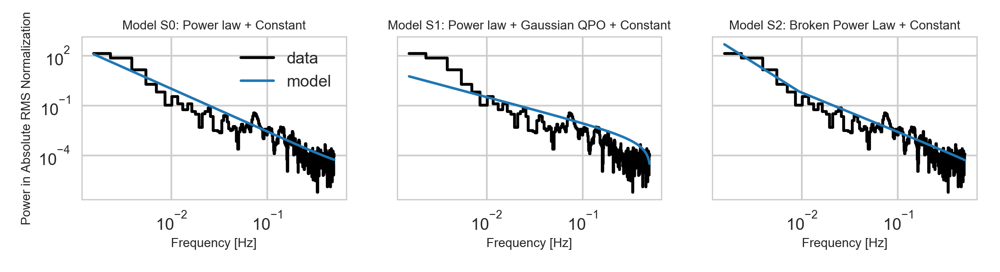

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285662716.585176_lc.dat
The BIC for model S0 is: -2396.802498149547
The BIC for model S1 is: -2377.9398025589217
The BIC for model S2 is: -2389.5596609700588

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 18.862695590625208
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 11.619858411137102
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.242837179488106


<IPython.core.display.Javascript object>


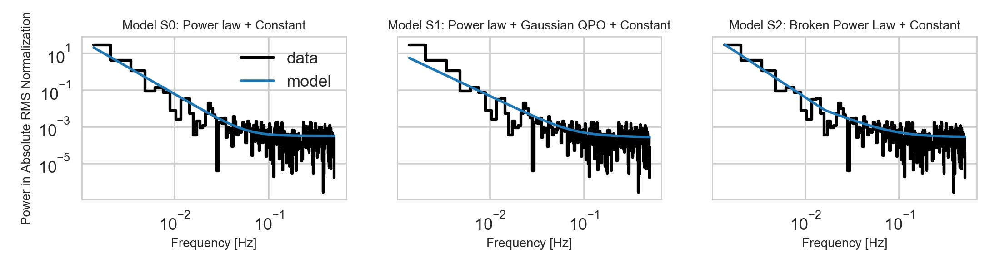

In [1003]:
for f in lc_files[:10]:
    print("I am on file %s"%f)
    model_periodogram(f)

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285616728.642852_lc.dat
The BIC for model S0 is: -3368.973622102595
The BIC for model S1 is: -3355.5670584651057
The BIC for model S2 is: -3366.0946570022843

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.406563637489398
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 10.52759853717862
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 2.8789651003107792


<IPython.core.display.Javascript object>


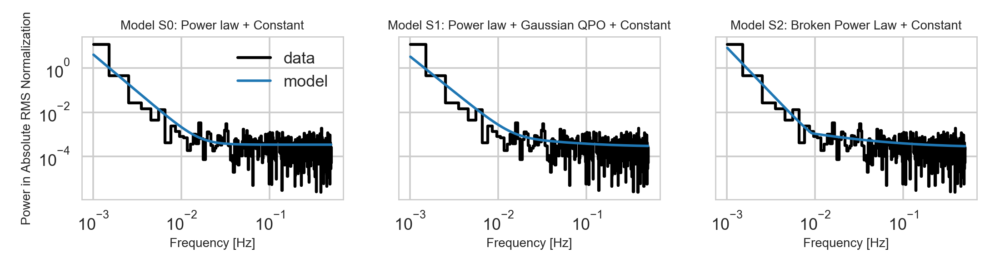

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100207_287210840.660462_lc.dat
The BIC for model S0 is: -2961.3006879792024
The BIC for model S1 is: -2446.4364160238188
The BIC for model S2 is: -2954.821707090317

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 514.8642719553836
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 508.3852910664982
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 6.478980888885417


<IPython.core.display.Javascript object>


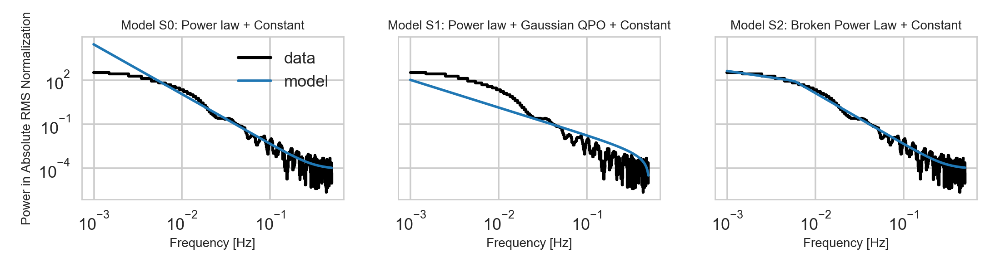

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/081102_247351845.772976_lc.dat
The BIC for model S0 is: -114.14012458556999
The BIC for model S1 is: -105.18255826865582
The BIC for model S2 is: -109.12968909407272

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 8.957566316914168
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 3.9471308254168918
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.010435491497276


<IPython.core.display.Javascript object>


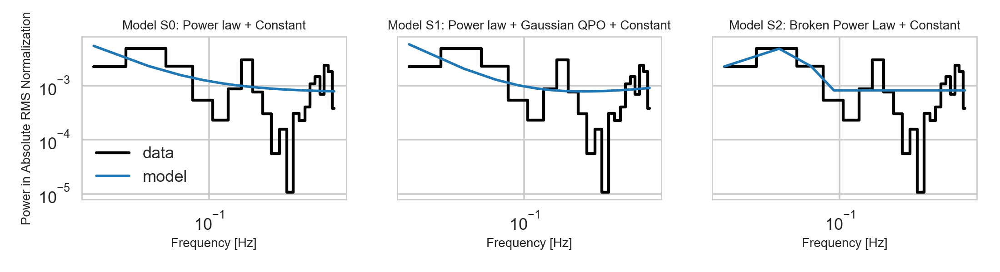

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285702743.585176_lc.dat
The BIC for model S0 is: -6024.25519676451
The BIC for model S1 is: -4946.406957137255
The BIC for model S2 is: -6014.242867647639

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 1077.8482396272557
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 1067.8359105103846
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.012329116871115


<IPython.core.display.Javascript object>


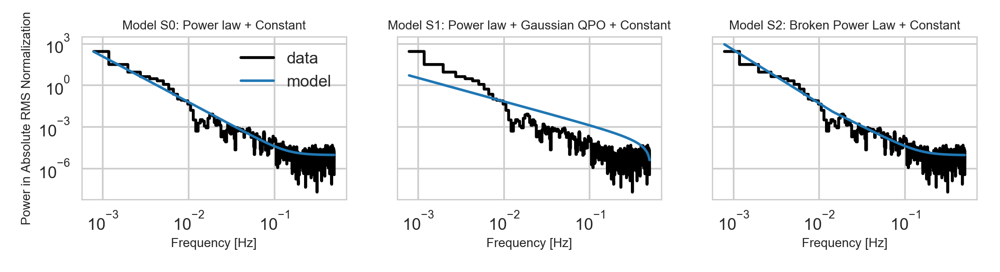

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100207_287222394.660462_lc.dat
The BIC for model S0 is: -157.57295684265188
The BIC for model S1 is: -148.4025723955682
The BIC for model S2 is: -151.09825205189148

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 9.170384447083677
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 2.6956796563232786
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 6.4747047907603985


<IPython.core.display.Javascript object>


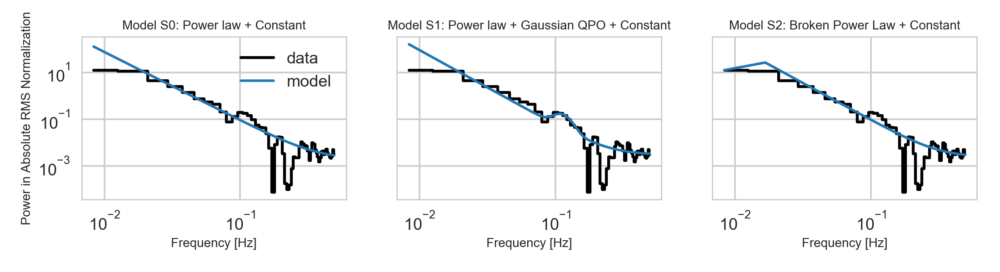

In [1004]:
for f in lc_files[10:15]:
    print("I am on file %s"%f)
    model_periodogram(f)

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100121_285763633.492196_lc.dat
The BIC for model S0 is: -322.56509061284123
The BIC for model S1 is: -307.32374364951147
The BIC for model S2 is: -314.4437237703477

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.241346963329761
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.119980120836203
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.121366842493558


<IPython.core.display.Javascript object>


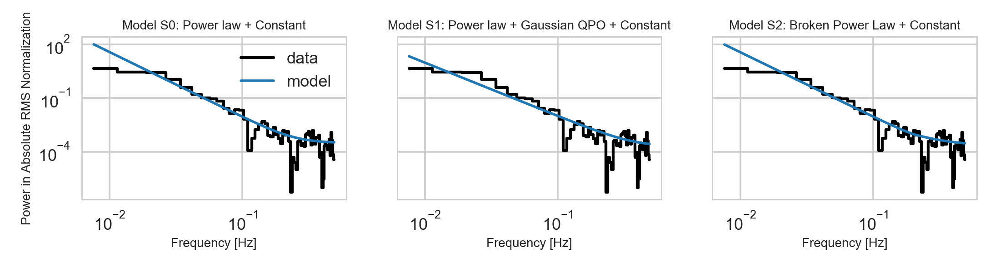

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091216_282619513.493948_lc.dat
The BIC for model S0 is: -6326.268071692613
The BIC for model S1 is: -6313.935622243714
The BIC for model S2 is: -6313.757369718059

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 12.332449448899752
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): -0.1782525256548979
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.51070197455465


<IPython.core.display.Javascript object>


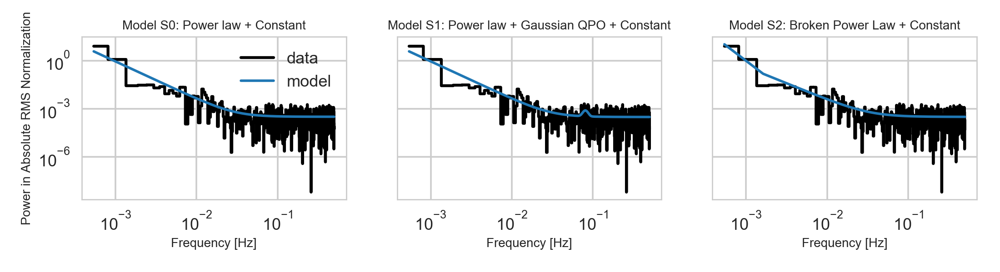

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287188108.624864_lc.dat
The BIC for model S0 is: -781.3079140529439
The BIC for model S1 is: -765.721334478213
The BIC for model S2 is: -771.5870312797935

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.58657957473099
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.865696801580498
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.720882773150493


<IPython.core.display.Javascript object>


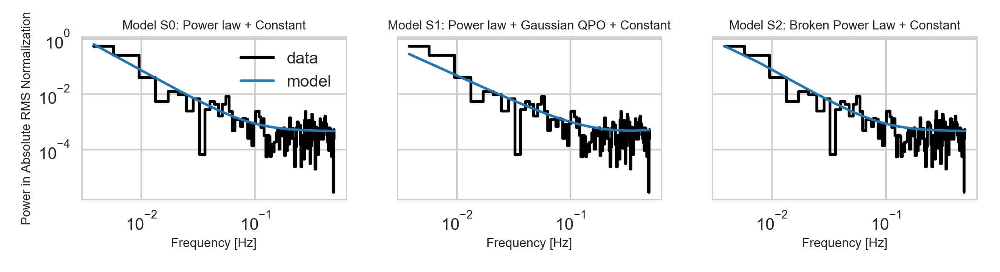

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287280920.569092_lc.dat
The BIC for model S0 is: -304.50138149901096
The BIC for model S1 is: -292.7713342710854
The BIC for model S2 is: -297.1801549471439

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 11.730047227925581
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.408820676058497
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.321226551867085


<IPython.core.display.Javascript object>


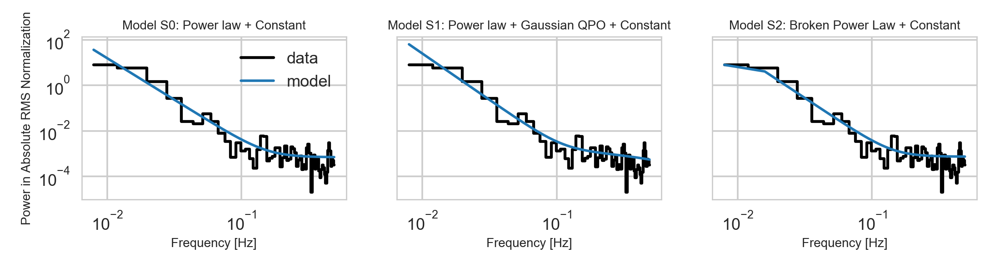

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285677563.585176_lc.dat
The BIC for model S0 is: -444.15179030325385
The BIC for model S1 is: -439.0043372212067
The BIC for model S2 is: -436.1215579003013

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 5.14745308204715
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): -2.8827793209053993
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.03023240295255


<IPython.core.display.Javascript object>


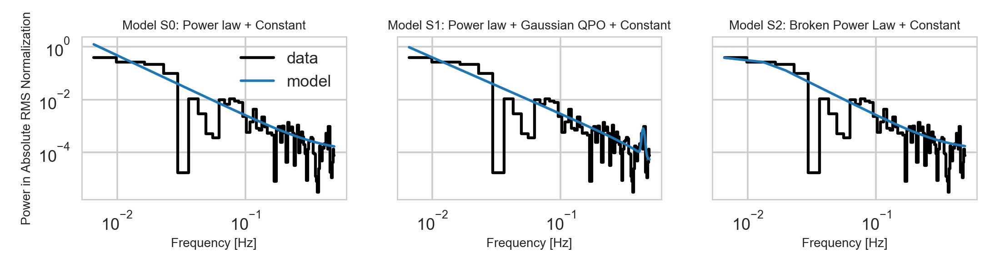

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285599305.642852_lc.dat
The BIC for model S0 is: -6161.1298868354
The BIC for model S1 is: -6141.248459894658
The BIC for model S2 is: -6150.9271321844235

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.88142694074213
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 9.678672289765927
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.202754650976203


<IPython.core.display.Javascript object>


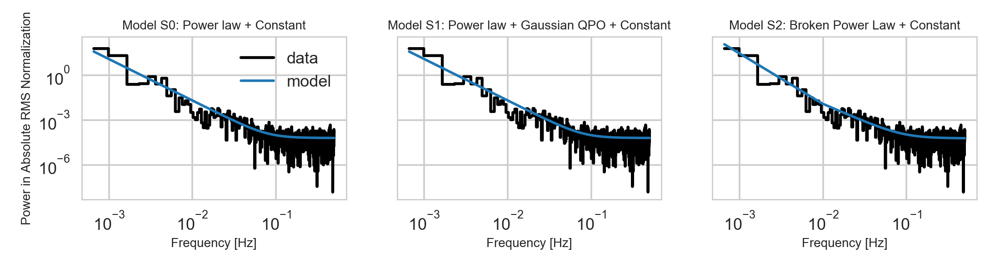

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100213_287759446.920854_lc.dat
The BIC for model S0 is: -3311.8843778185187
The BIC for model S1 is: -3291.9447265971157
The BIC for model S2 is: -3299.590450254612

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.939651221402983
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.645723657496092
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.293927563906891


<IPython.core.display.Javascript object>


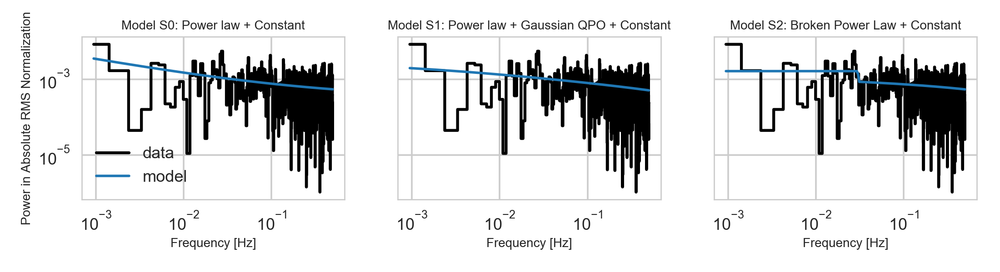

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287186510.624864_lc.dat
The BIC for model S0 is: -1595.7154013636325
The BIC for model S1 is: -1578.995698125546
The BIC for model S2 is: -1585.0635478370343

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 16.719703238086595
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.067849711488407
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.651853526598188


<IPython.core.display.Javascript object>


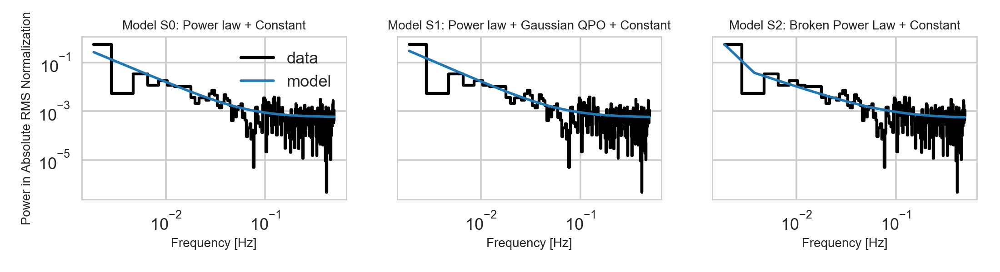

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287295548.569092_lc.dat
The BIC for model S0 is: -1674.3886802903917
The BIC for model S1 is: -1663.8962300513601
The BIC for model S2 is: -1669.2343057177422

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 10.492450239031541
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.33807566638211
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.154374572649431


<IPython.core.display.Javascript object>


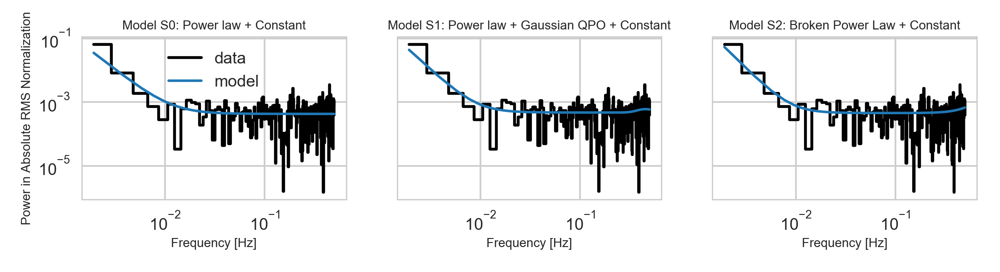

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091027_278364999.635926_lc.dat
The BIC for model S0 is: -824.9659703169381
The BIC for model S1 is: -810.4200832032542
The BIC for model S2 is: -815.2485636426188

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.545887113683875
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.8284804393646255
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.71740667431925


<IPython.core.display.Javascript object>


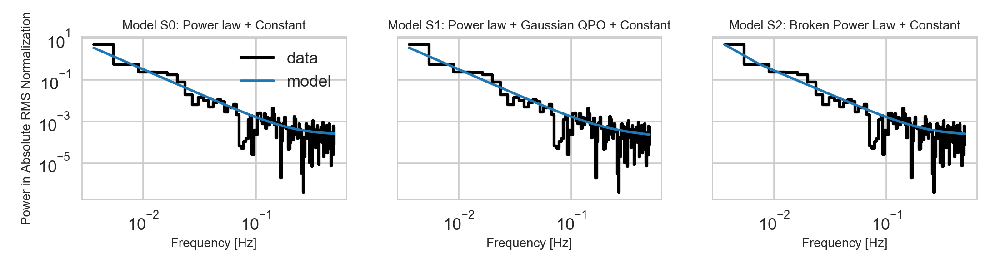

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285661278.585176_lc.dat
The BIC for model S0 is: -4686.239679442087
The BIC for model S1 is: -4666.093982216613
The BIC for model S2 is: -4674.902915532783

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 20.145697225474578
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 8.808933316169714
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 11.336763909304864


<IPython.core.display.Javascript object>


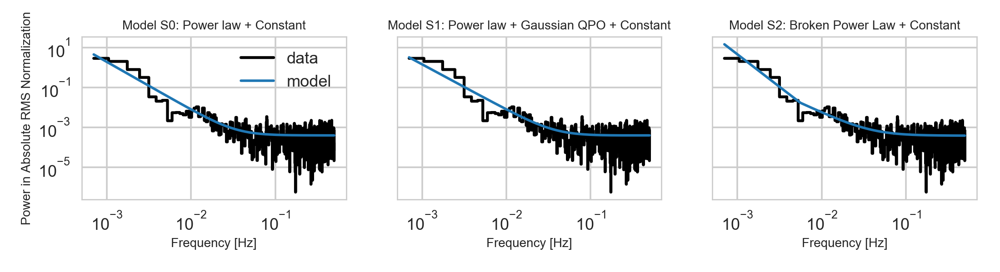

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100209_287381645.492866_lc.dat
The BIC for model S0 is: -813.04625655129
The BIC for model S1 is: -798.1056708528865
The BIC for model S2 is: -805.6402545162415

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.940585698403424
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.534583663354965
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.406002035048459


<IPython.core.display.Javascript object>


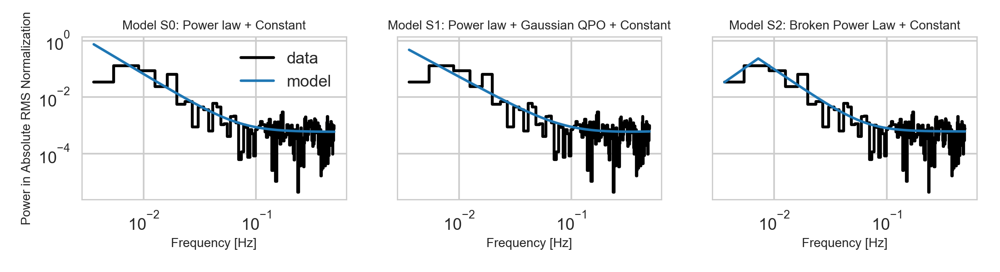

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091210_282135384.611800_lc.dat
The BIC for model S0 is: -494.2210594166437
The BIC for model S1 is: -438.181178281718
The BIC for model S2 is: -485.60980494654154

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 56.03988113492568
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 47.428626664823526
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.611254470102153


<IPython.core.display.Javascript object>


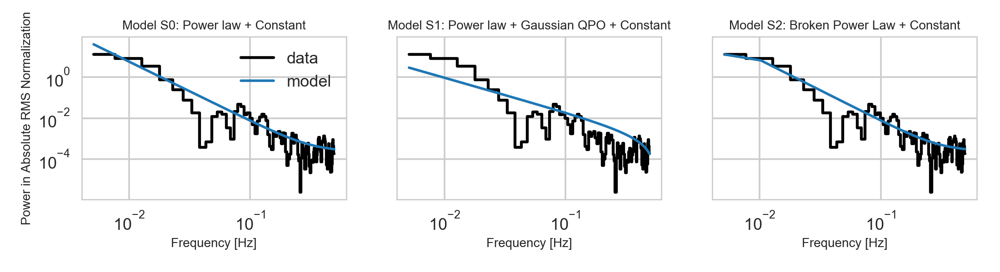

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287319758.569092_lc.dat
The BIC for model S0 is: -2632.399397100751
The BIC for model S1 is: -2626.2623132598874
The BIC for model S2 is: -2625.3089507539457

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 6.137083840863397
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): -0.9533625059416408
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.090446346805038


<IPython.core.display.Javascript object>


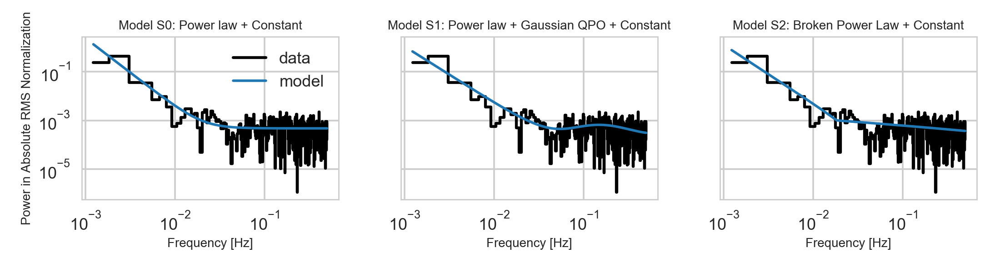

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091218_282855150.488352_lc.dat
The BIC for model S0 is: -1836.4383647460845
The BIC for model S1 is: -1821.0799259029077
The BIC for model S2 is: -1831.0618734565876

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.358438843176828
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 9.981947553679902
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.376491289496926


<IPython.core.display.Javascript object>


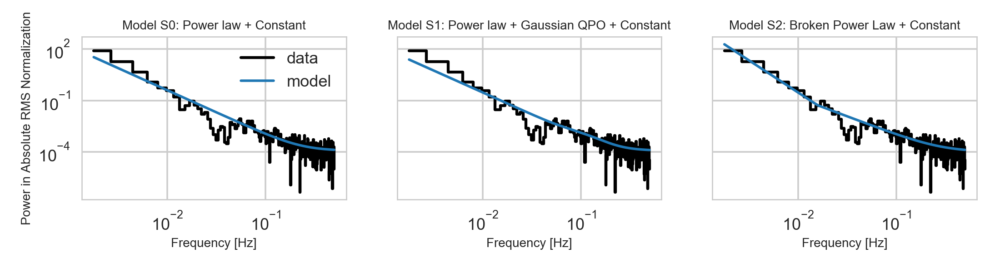

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287358961.569092_lc.dat
The BIC for model S0 is: -621.9554051655307
The BIC for model S1 is: -608.3950942040307
The BIC for model S2 is: -613.0681866548987

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.560310961500022
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.673092450868012
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.88721851063201


<IPython.core.display.Javascript object>


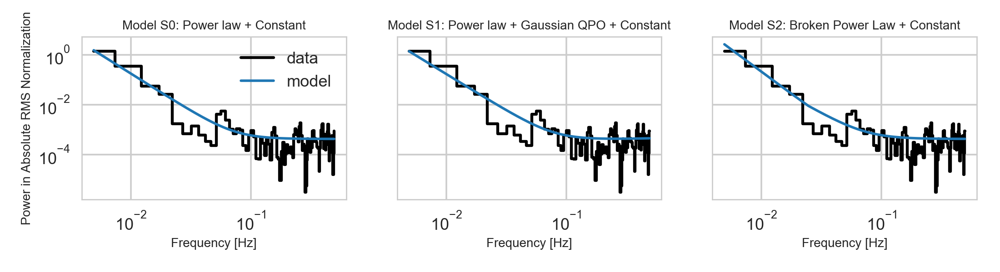

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285625940.642852_lc.dat
The BIC for model S0 is: -8803.040174440175
The BIC for model S1 is: -8786.522748018866
The BIC for model S2 is: -8801.964737224784

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 16.51742642130921
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 15.441989205917707
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 1.0754372153915028


<IPython.core.display.Javascript object>


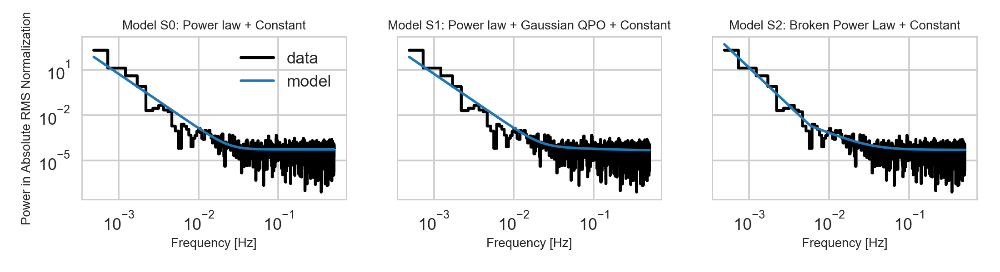

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091025_278129819.672740_lc.dat
The BIC for model S0 is: -3614.7774069895654
The BIC for model S1 is: -3595.4152318302763
The BIC for model S2 is: -3604.675893193919

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.36217515928911
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 9.260661363642612
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.101513795646497


<IPython.core.display.Javascript object>


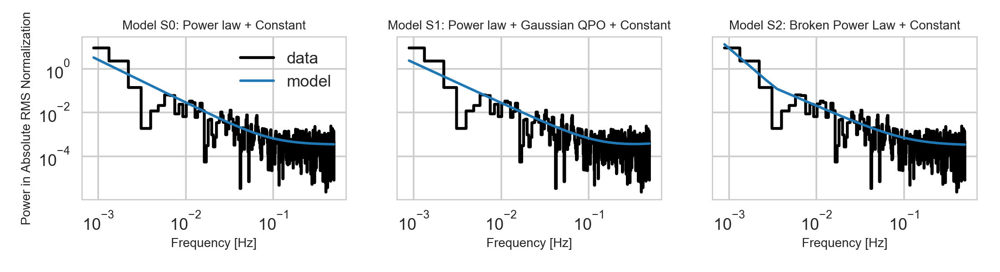

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285683382.585176_lc.dat
The BIC for model S0 is: -1303.8557915176955
The BIC for model S1 is: -1288.4807096085992
The BIC for model S2 is: -1297.0937422792258

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.375081909096252
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 8.61303267062658
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 6.762049238469672


<IPython.core.display.Javascript object>


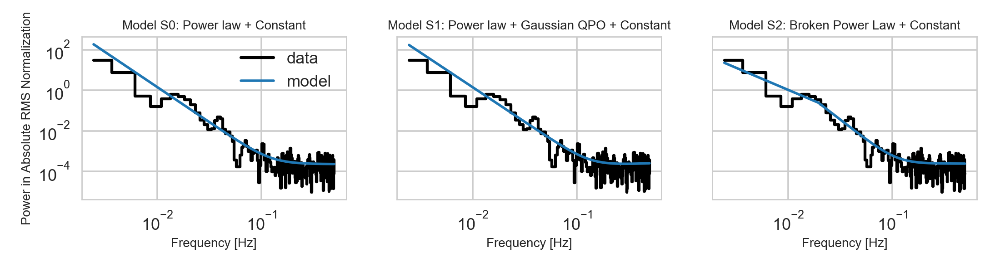

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287315760.569092_lc.dat
The BIC for model S0 is: -1365.4506637733548
The BIC for model S1 is: -1349.8857632051265
The BIC for model S2 is: -1356.2912163875533

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.564900568228268
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.405453182426754
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.159447385801514


<IPython.core.display.Javascript object>


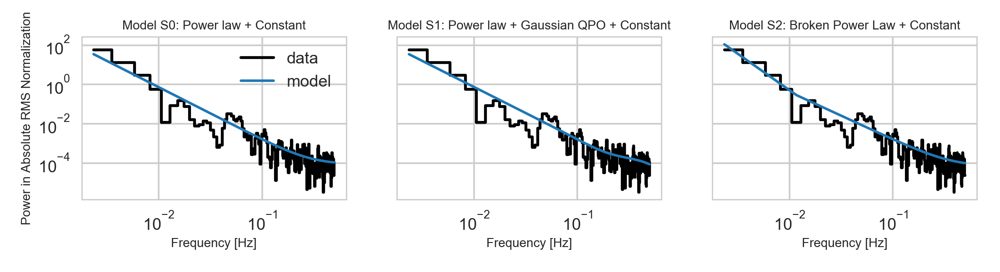

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100213_287742451.920854_lc.dat
The BIC for model S0 is: -2580.354033434282
The BIC for model S1 is: -2557.886814168571
The BIC for model S2 is: -2569.044937936006

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 22.46721926571081
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 11.158123767434972
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 11.309095498275838


<IPython.core.display.Javascript object>


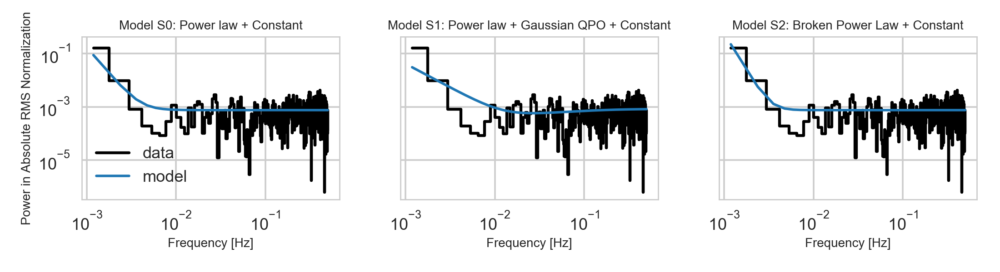

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285615959.642852_lc.dat
The BIC for model S0 is: -537.4518830229381
The BIC for model S1 is: -524.1609811398321
The BIC for model S2 is: -529.1524960949525

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.290901883106017
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.991514955120465
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.299386927985552


<IPython.core.display.Javascript object>


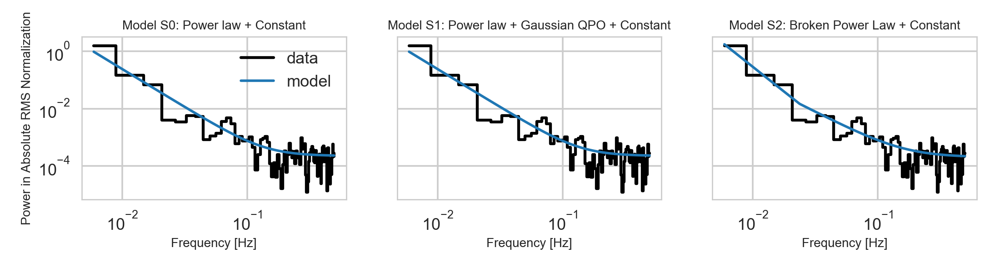

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100209_287371089.492866_lc.dat
The BIC for model S0 is: -2137.8511778530296
The BIC for model S1 is: -2108.4309821605275
The BIC for model S2 is: -2129.6193135295325

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 29.420195692502148
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 21.188331369005027
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.23186432349712


<IPython.core.display.Javascript object>


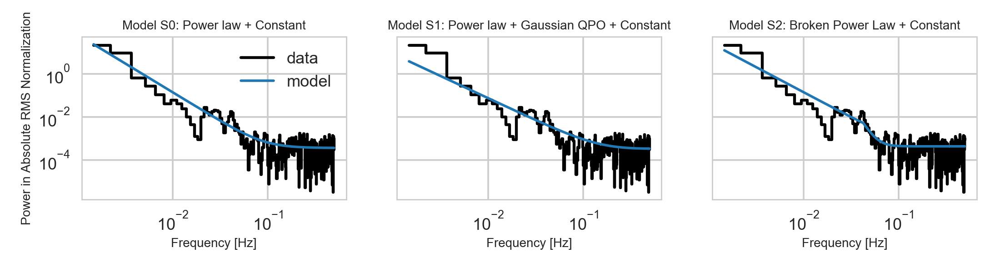

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285667331.585176_lc.dat
The BIC for model S0 is: -2894.7451096510063
The BIC for model S1 is: -2883.7349354600583
The BIC for model S2 is: -2883.885861725504

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 11.010174190947964
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 0.15092626544583254
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.859247925502132


<IPython.core.display.Javascript object>


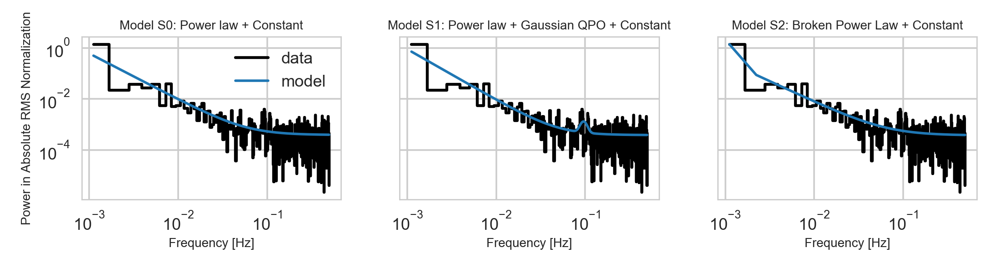

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100209_287407716.492866_lc.dat
The BIC for model S0 is: -782.2020835329885
The BIC for model S1 is: -772.5235854069142
The BIC for model S2 is: -773.3224250070772

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 9.67849812607426
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 0.7988396001629781
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.879658525911282


<IPython.core.display.Javascript object>


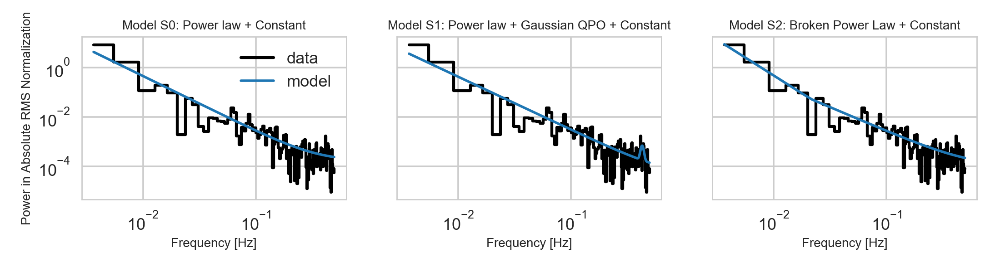

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100118_285539903.595890_lc.dat
The BIC for model S0 is: -6391.392572845851
The BIC for model S1 is: -6416.341208952081
The BIC for model S2 is: -6422.952175362425

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): -24.94863610622997
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.61096641034419
Delta BIC for BPL versus PL model (large positive number means PL is favoured): -31.55960251657416


<IPython.core.display.Javascript object>


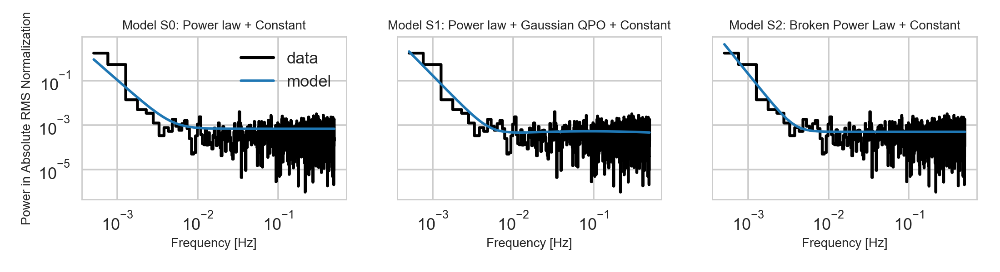

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287307476.569092_lc.dat
The BIC for model S0 is: -3794.7559277663922
The BIC for model S1 is: -3776.434632177924
The BIC for model S2 is: -3794.903403329956

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 18.321295588468274
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 18.468771152031877
Delta BIC for BPL versus PL model (large positive number means PL is favoured): -0.14747556356360292


<IPython.core.display.Javascript object>


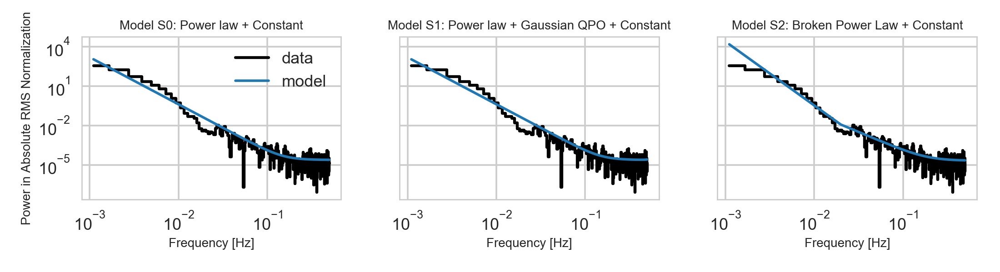

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091216_282645380.493948_lc.dat
The BIC for model S0 is: -119.77203250721007
The BIC for model S1 is: -108.49534922082701
The BIC for model S2 is: -112.74343008638373

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 11.276683286383061
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.248080865556716
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.028602420826346


<IPython.core.display.Javascript object>


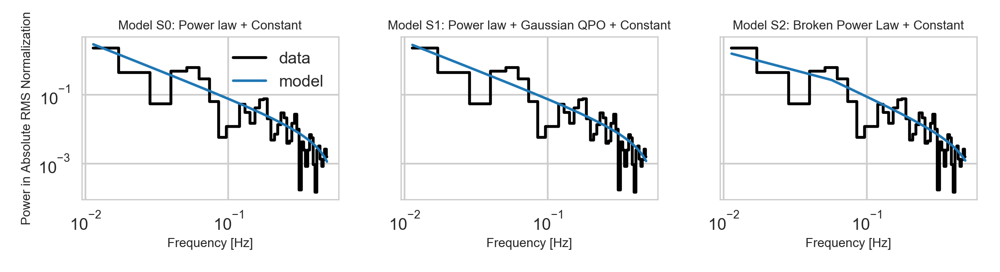

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287189238.624864_lc.dat
The BIC for model S0 is: -784.6410351741334
The BIC for model S1 is: -771.3401623772688
The BIC for model S2 is: -777.3777704919405

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.30087279686461
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.037608114671684
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.263264682192926


<IPython.core.display.Javascript object>


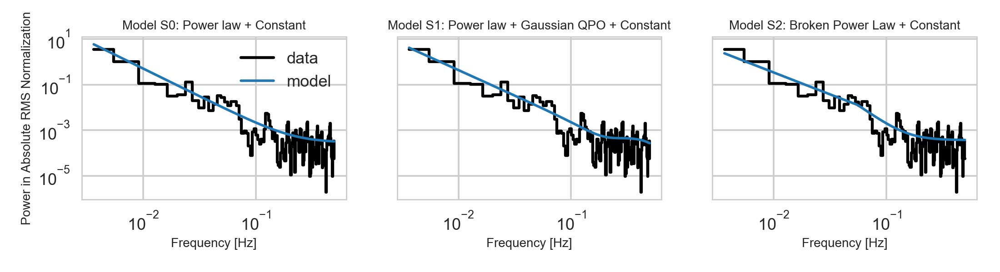

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287301706.569092_lc.dat
The BIC for model S0 is: -4076.4105360693134
The BIC for model S1 is: -3775.537311295309
The BIC for model S2 is: -4066.248941982575

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 300.8732247740045
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 290.7116306872663
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.161594086738205


<IPython.core.display.Javascript object>


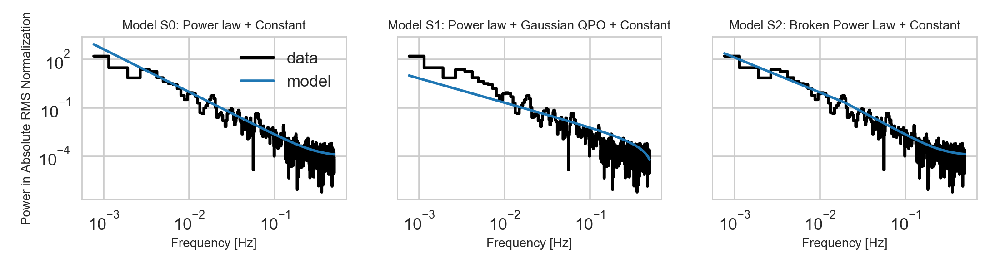

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287175044.624864_lc.dat
The BIC for model S0 is: -12321.596095853314
The BIC for model S1 is: -12300.404147203039
The BIC for model S2 is: -12326.47917568873

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 21.191948650275663
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 26.07502848569129
Delta BIC for BPL versus PL model (large positive number means PL is favoured): -4.883079835415629


<IPython.core.display.Javascript object>


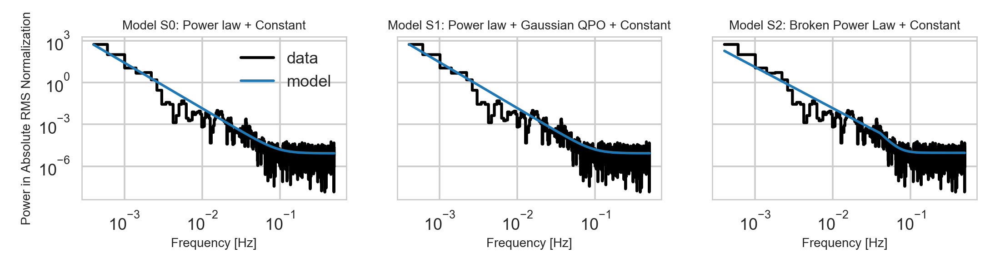

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285603003.642852_lc.dat
The BIC for model S0 is: -2811.175264662354
The BIC for model S1 is: -2793.09200145271
The BIC for model S2 is: -2805.21723607917

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 18.083263209643974
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 12.125234626460042
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.958028583183932


<IPython.core.display.Javascript object>


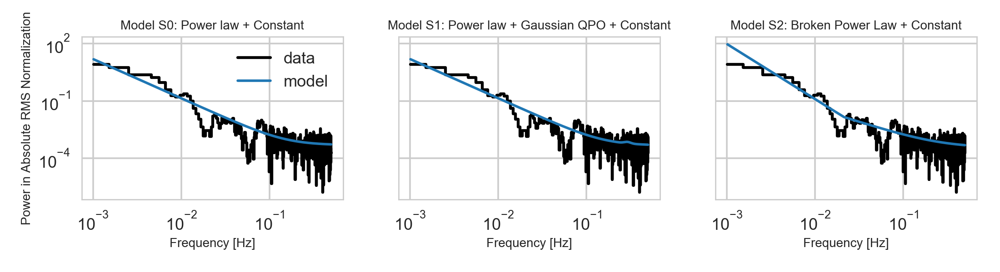

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091027_278301126.635926_lc.dat
The BIC for model S0 is: -517.5732421689402
The BIC for model S1 is: -503.33618166520057
The BIC for model S2 is: -511.6951352400475

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.237060503739599
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 8.358953574846907
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.8781069288926915


<IPython.core.display.Javascript object>


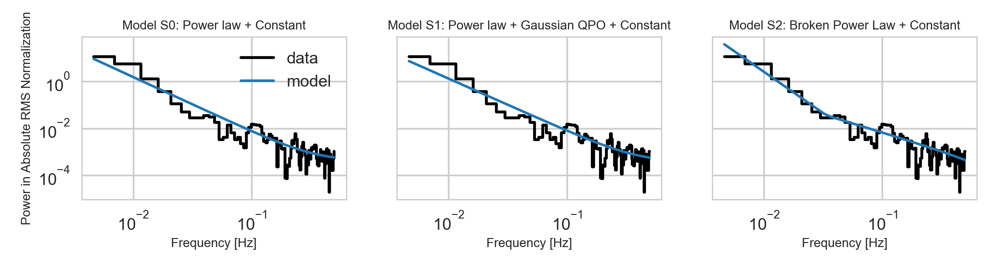

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091221_283080071.581818_lc.dat
The BIC for model S0 is: -1254.810751387526
The BIC for model S1 is: -1239.0131646513673
The BIC for model S2 is: -1244.6996605484014

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.797586736158564
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.686495897034092
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.111090839124472


<IPython.core.display.Javascript object>


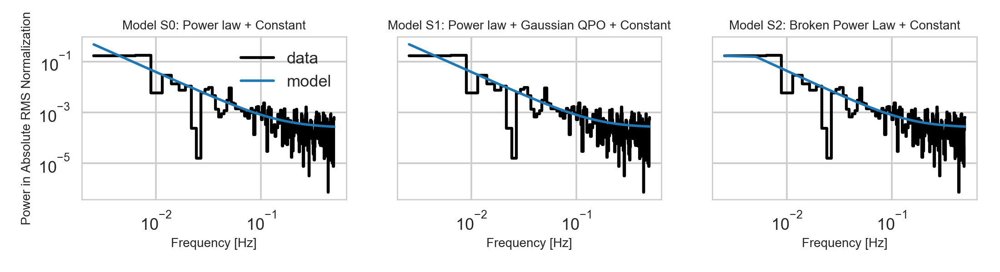

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091027_278341791.635926_lc.dat
The BIC for model S0 is: -666.2833340621033
The BIC for model S1 is: -652.2663547957436
The BIC for model S2 is: -656.9635335240763

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.016979266359726
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.697178728332688
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.319800538027039


<IPython.core.display.Javascript object>


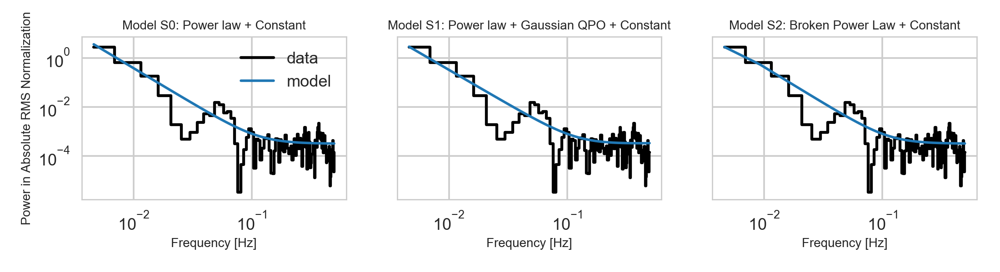

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285663551.585176_lc.dat
The BIC for model S0 is: -1221.087980363114
The BIC for model S1 is: -1192.0588658022482
The BIC for model S2 is: -1212.319181960187

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 29.029114560865764
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 20.26031615793886
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.768798402926905


<IPython.core.display.Javascript object>


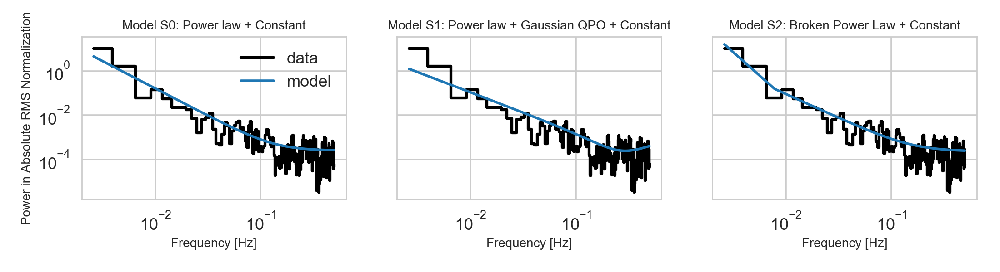

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100210_287532406.559582_lc.dat
The BIC for model S0 is: -745.1412185607811
The BIC for model S1 is: -729.6519107909154
The BIC for model S2 is: -738.3593166544144

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.489307769865718
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 8.707405863499048
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 6.78190190636667


<IPython.core.display.Javascript object>


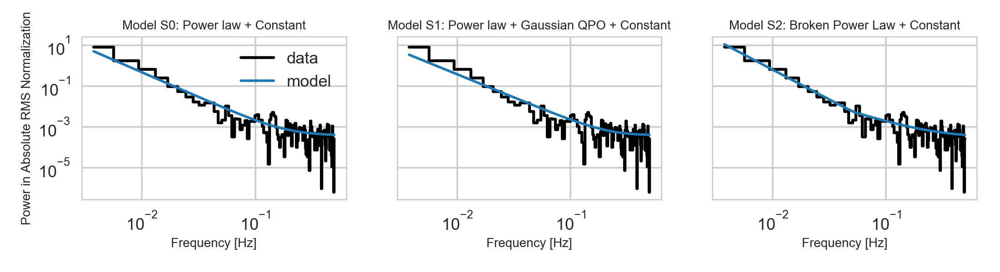

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100119_285632727.642852_lc.dat
The BIC for model S0 is: -3509.676456245047
The BIC for model S1 is: -3492.566802532792
The BIC for model S2 is: -3506.358645329623

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 17.109653712255295
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 13.791842796831133
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 3.317810915424161


<IPython.core.display.Javascript object>


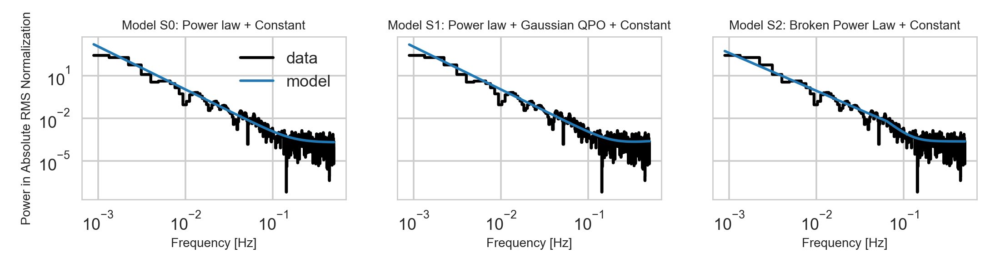

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100104_284269156.649746_lc.dat
The BIC for model S0 is: -439.9799490600712
The BIC for model S1 is: -426.38215053674605
The BIC for model S2 is: -435.76772249685376

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.597798523325139
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 9.385571960107711
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 4.212226563217428


<IPython.core.display.Javascript object>


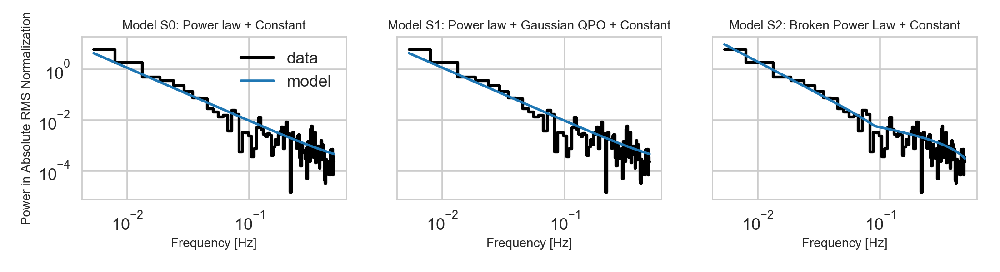

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100120_285639130.585176_lc.dat
The BIC for model S0 is: -3553.7724987044376
The BIC for model S1 is: -3533.8925231909793
The BIC for model S2 is: -3541.3491352932215

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.87997551345825
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.456612102242161
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.423363411216087


<IPython.core.display.Javascript object>


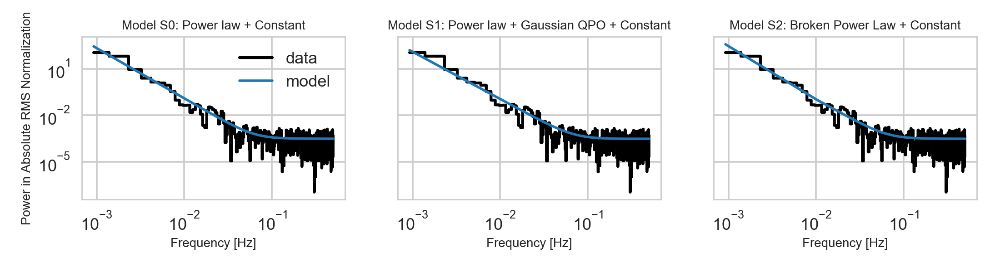

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091216_282660766.493948_lc.dat
The BIC for model S0 is: -4924.253711990702
The BIC for model S1 is: -4943.943725026511
The BIC for model S2 is: -5035.284934040843

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): -19.690013035808988
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 91.34120901433198
Delta BIC for BPL versus PL model (large positive number means PL is favoured): -111.03122205014097


<IPython.core.display.Javascript object>


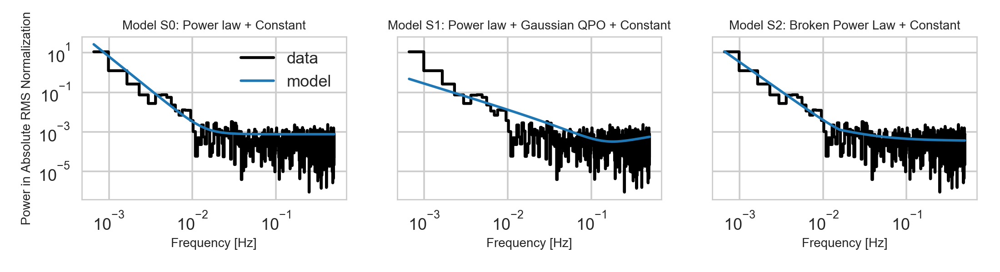

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287291460.569092_lc.dat
The BIC for model S0 is: -4426.099859922469
The BIC for model S1 is: -4407.02113831564
The BIC for model S2 is: -4419.749140536669

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.078721606828367
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 12.728002221028873
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 6.3507193857994935


<IPython.core.display.Javascript object>


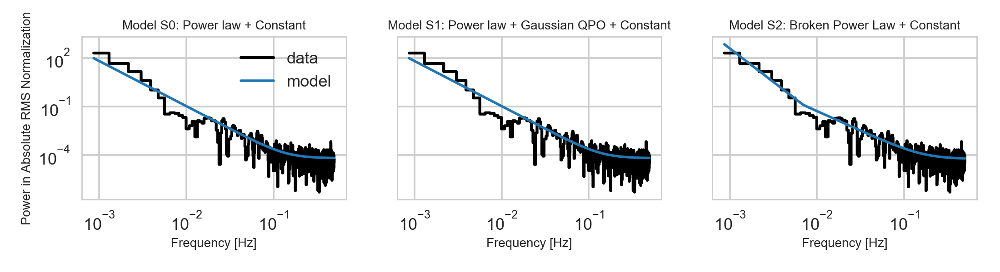

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/081102_247349695.772976_lc.dat
The BIC for model S0 is: -10604.637730138717
The BIC for model S1 is: -6551.090587571075
The BIC for model S2 is: -10592.462245037876

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 4053.5471425676415
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4041.3716574668006
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.175485100840888


<IPython.core.display.Javascript object>


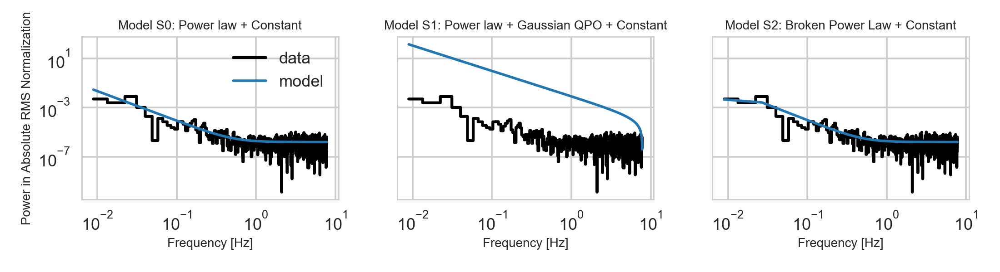

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287298780.569092_lc.dat
The BIC for model S0 is: -1332.2935011742618
The BIC for model S1 is: -1310.3886926662813
The BIC for model S2 is: -1321.3517865843698

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 21.904808507980533
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 10.963093918088589
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.941714589891944


<IPython.core.display.Javascript object>


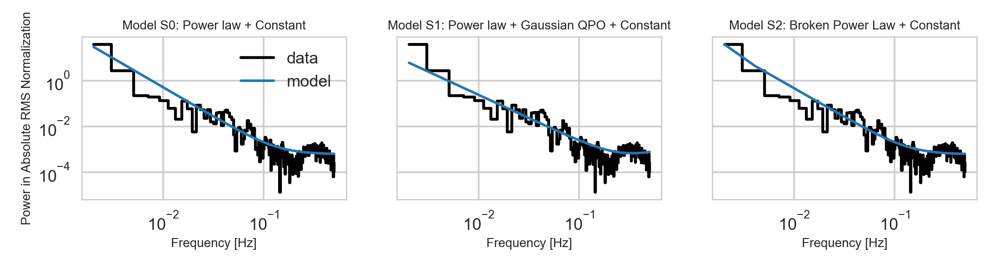

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/091027_278331263.635926_lc.dat
The BIC for model S0 is: -2060.9516361950973
The BIC for model S1 is: -2041.2133897395752
The BIC for model S2 is: -2046.172837160394

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 19.73824645552213
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.959447420818833
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 14.778799034703297


<IPython.core.display.Javascript object>


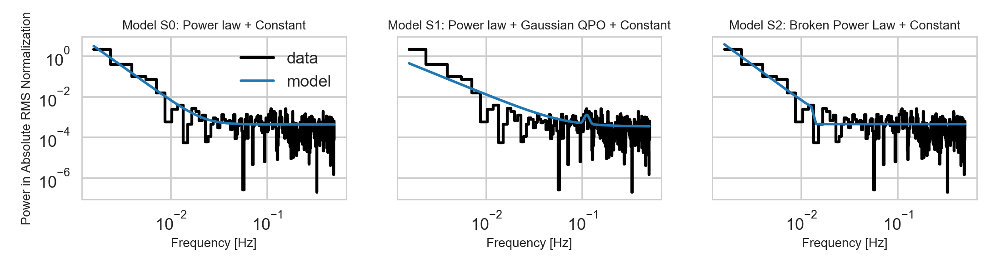

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287132517.624864_lc.dat
The BIC for model S0 is: -1063.1911101120413
The BIC for model S1 is: -1047.7142496610143
The BIC for model S2 is: -1053.5033758285774

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 15.47686045102705
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.789126167563154
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 9.687734283463897


<IPython.core.display.Javascript object>


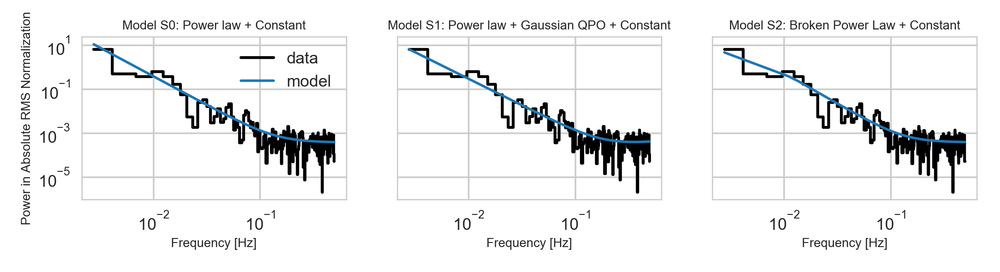

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100207_287203724.660462_lc.dat
The BIC for model S0 is: -2953.283979857748
The BIC for model S1 is: -2934.7795170288937
The BIC for model S2 is: -2941.0737469591445

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 18.50446282885423
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 6.294229930250822
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 12.210232898603408


<IPython.core.display.Javascript object>


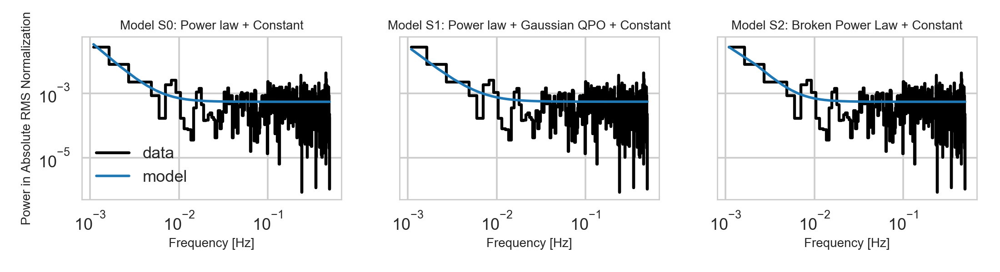

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100121_285729493.492196_lc.dat
The BIC for model S0 is: -2521.0139103925594
The BIC for model S1 is: -2504.0905548229302
The BIC for model S2 is: -2509.535378211478

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 16.923355569629166
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.444823388547775
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 11.478532181081391


<IPython.core.display.Javascript object>


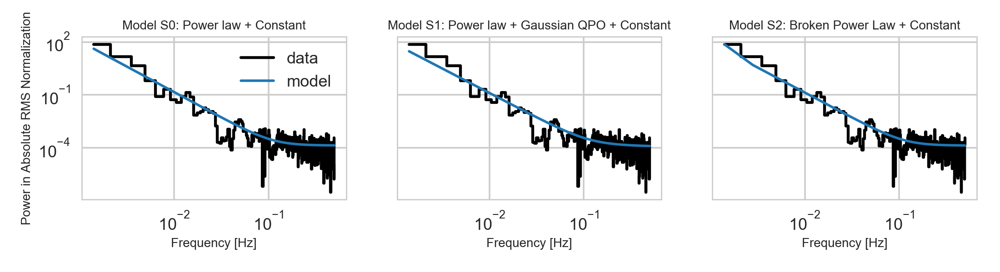

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287336883.569092_lc.dat
The BIC for model S0 is: -1780.6990525903323
The BIC for model S1 is: -1764.638337241062
The BIC for model S2 is: -1775.5393687733344

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 16.060715349270367
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 10.901031532272555
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 5.159683816997813


<IPython.core.display.Javascript object>


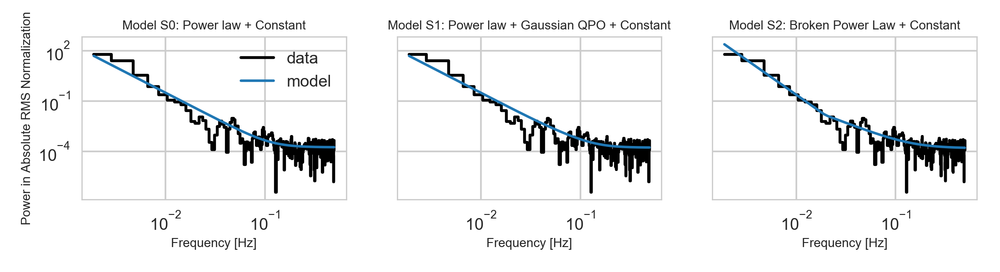

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100206_287163553.624864_lc.dat
The BIC for model S0 is: -2644.6585442224423
The BIC for model S1 is: -2778.344309873119
The BIC for model S2 is: -2785.3911146423166

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): -133.68576565067679
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.046804769197479
Delta BIC for BPL versus PL model (large positive number means PL is favoured): -140.73257041987426


<IPython.core.display.Javascript object>


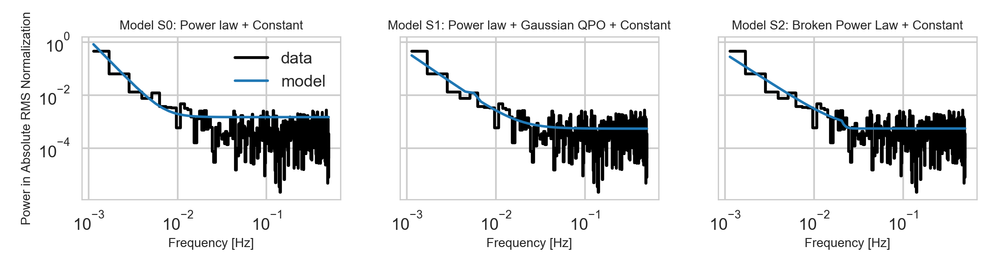

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100118_285537401.595890_lc.dat
The BIC for model S0 is: -1014.0919361536917
The BIC for model S1 is: -999.623964918941
The BIC for model S2 is: -1003.9039568958395

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 14.467971234750621
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.279991976898486
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 10.187979257852135


<IPython.core.display.Javascript object>


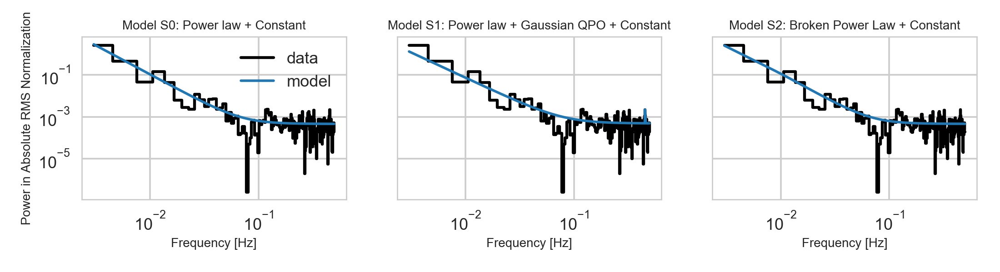

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100212_287660440.645496_lc.dat
The BIC for model S0 is: -235.0964976103146
The BIC for model S1 is: -224.14133103737564
The BIC for model S2 is: -227.27706574299367

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 10.955166572938964
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 3.1357347056180345
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 7.8194318673209295


<IPython.core.display.Javascript object>


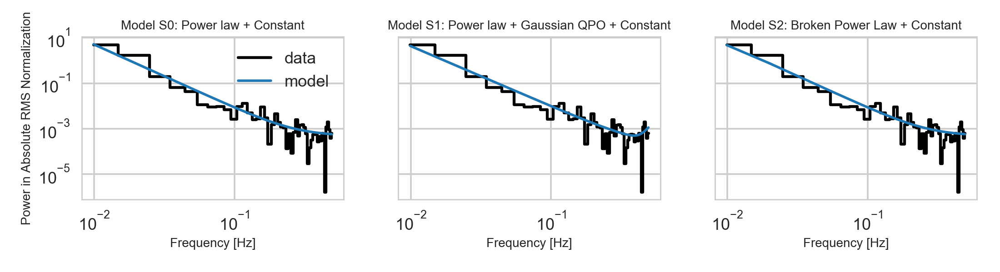

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/081211_250688534.741364_lc.dat
The BIC for model S0 is: -658.5005873898655
The BIC for model S1 is: -645.1821204789131
The BIC for model S2 is: -649.9341887952268

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 13.318466910952338
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 4.7520683163136255
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 8.566398594638713


<IPython.core.display.Javascript object>


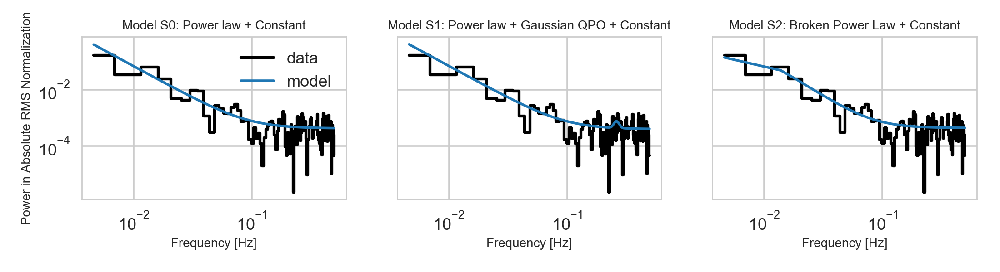

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100208_287348739.569092_lc.dat
The BIC for model S0 is: -1566.847786353092
The BIC for model S1 is: -1555.345817434927
The BIC for model S2 is: -1562.9673312203709

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 11.501968918164948
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 7.621513785443767
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 3.880455132721181


<IPython.core.display.Javascript object>


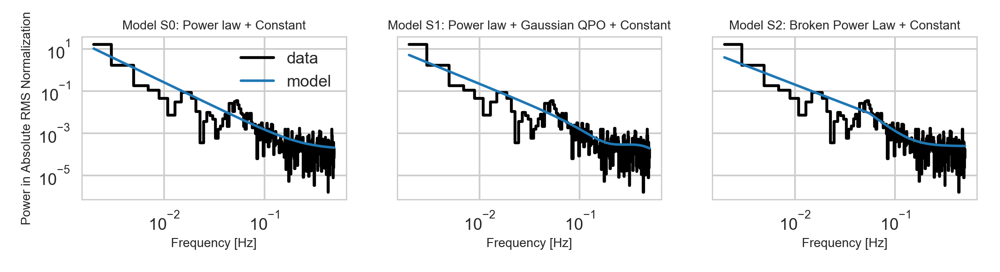

I am on file /Users/danielahuppenkothen/work/data/solarflares/fermi/100212_287652064.645496_lc.dat
The BIC for model S0 is: -2065.2170228295704
The BIC for model S1 is: -2047.9155499713784
The BIC for model S2 is: -2053.450824811081

Delta BIC for QPO+PL versus PL model (large positive number means PL is favoured): 17.301472858192028
Delta BIC for QPO+PL versus BPL model (large positive number means BPL is favoured): 5.535274839702652
Delta BIC for BPL versus PL model (large positive number means PL is favoured): 11.766198018489376


<IPython.core.display.Javascript object>


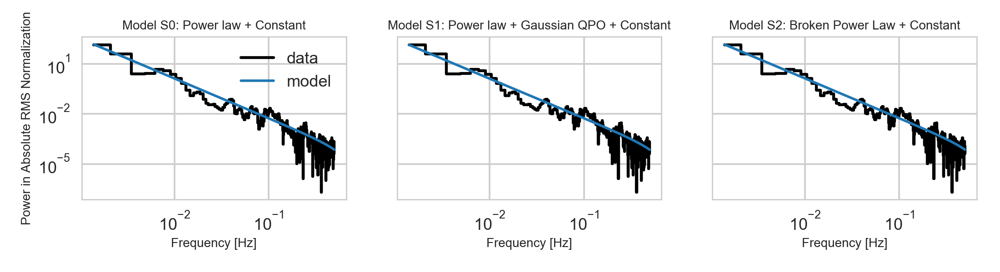

In [1005]:
for f in lc_files[15:]:
    print("I am on file %s"%f)
    model_periodogram(f)